***************************************** **Telecom-Churn** *****************************************
---

---
# **Domine Analysis:**
---
### Business Case:
No-Churn Telecom is an established Telecom operator in Europe with more than a decade in Business. Due to new players in the market, telecom industry has become very competitive and retaining customers becoming a challenge.In spite of No-Churn initiatives of reducing tariffs and promoting more offers, the churn rate (percentage of customers migrating to competitors) is well above 10%.No-Churn wants to explore possibility of Machine Learning to help with following use cases to retain competitive edge in the industry.

### PROJECT GOAL
Help No-Churn with their use cases with ML

1. Understanding the variables that are influencing the customers to migrate.
2. Creating Churn risk scores that can be indicative to drive retention campaigns.
3. Introduce new predicting variable “CHURN-FLAG” with values YES(1) or NO(0) so that email campaigns with lucrative offers can be targeted to Churn YES customers help to identify possible CHURN-FLAG YES customers and provide more attention in customer touch point areas, including customer care support, request fulfilment, auto categorizing tickets as high priority for quick resolutions any questions they may have etc.,
#### **Description:-**

 * **State:** Represents the state in which the customer resides (e.g., KS for Kansas, OH for Ohio).

 * **Account Length:** Indicates the number of days the customer has been a subscriber.

 * **Area Code:** Represents the area code associated with the customer's phone number.

 * **Phone:** Represents the customer's phone number.

 * **International Plan:** Indicates whether the customer has an international calling plan (yes or no).

 * **VMail Plan:** Indicates whether the customer has a voicemail plan (yes or no).

 * **VMail Message:** Represents the number of voicemail messages the customer has.

 * **Day Mins:** Represents the total number of minutes the customer has used during the day.

 * **Day Calls:** Indicates the total number of calls the customer has made during the day.

 * **Day Charge:** Represents the total charge for daytime calls.

 * **Eve Mins:** Represents the total number of minutes the customer has used during the evening.

 * **Eve Calls:** Indicates the total number of calls the customer has made during the evening.

 * **Eve Charge:** Represents the total charge for evening calls.

 * **Night Mins:** Represents the total number of minutes the customer has used during the night.

 * **Night Calls:** Indicates the total number of calls the customer has made during the night.

 * **Night Charge:** Represents the total charge for nighttime calls.

 * **International Mins:** Represents the total number of international minutes the customer has used.

 * **International Calls:** Indicates the total number of international calls the customer has made.

 * **International Charge:** Represents the total charge for international calls.

 * **CustServ Calls:** Indicates the number of customer service calls made by the customer.

 * **Churn:** Indicates whether the customer has churned (canceled their subscription) or not (False).

In [7]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import os
import mysql.connector

# Suppress warnings to avoid cluttering the output
warnings.filterwarnings('ignore')

In [8]:
## connecting the databasefdgv
connection=mysql.connector.connect(host='18.136.157.135',
                                  user='dm_team3',
                                  password='DM!$!Team!27@9!20&',
                                  database='project_telecom',
                                  use_pure=True)

In [9]:
## Check the number of databases available on the server
cursor=connection.cursor()
cursor.execute('show databases')
for i in cursor:
    print(i)

('information_schema',)
('project_telecom',)


In [10]:
## show the table.
tables=pd.read_sql_query('show tables',connection)
print(tables)

  Tables_in_project_telecom
0        telecom_churn_data


In [11]:
# Retrieve data from the data table into a pandas DataFrame
data=pd.read_sql_query("select * from telecom_churn_data",connection)
data

,columns1,columns2,columns3,columns4,columns5,columns6,columns7,columns8,columns9,columns10,...,columns12,columns13,columns14,columns15,columns16,columns17,columns18,columns19,columns20,columns21
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,...,99,16.78,244.7,91,11.01,10,3,2.7,1,False.
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,...,103,16.62,254.4,103,11.45,13.7,3,3.7,1,False.
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,...,110,10.3,162.6,104,7.32,12.2,5,3.29,0,False.
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.9,...,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False.
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,...,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False.
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4612,NY,57,510,345-7512,no,yes,25,144,81,24.48,...,112,15.91,158.6,122,7.14,8.5,6,2.3,3,False.
4613,NM,177,408,343-6820,no,yes,29,189,91,32.13,...,96,25.76,163.6,116,7.36,15.7,1,4.24,3,False.
4614,VT,67,408,338-4794,no,yes,33,127.5,126,21.68,...,129,25.17,200.9,91,9.04,13,3,3.51,1,False.
4615,MI,98,415,355-8388,no,yes,23,168.9,98,28.71,...,117,19.24,165.5,96,7.45,14.3,3,3.86,0,False.


In [12]:
column_names = ['State', 'Account_Length', 'Area_Code','Phone','International_Plan','VMail_Plan','VMail_Message',
                'Day_Mins','Day_Calls','Day_Charge','Eve_Mins','Eve_Calls','Eve_Charge','Night_Mins','Night_Calls','Night_Charge',
                'International_Mins','International_calls','International_Charge','CustServ_Calls','Churn']

In [13]:
data.columns = column_names

In [14]:
pd.set_option('display.max_columns', None)

In [15]:
data

,State,Account_Length,Area_Code,Phone,International_Plan,VMail_Plan,VMail_Message,Day_Mins,Day_Calls,Day_Charge,Eve_Mins,Eve_Calls,Eve_Charge,Night_Mins,Night_Calls,Night_Charge,International_Mins,International_calls,International_Charge,CustServ_Calls,Churn
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10,3,2.7,1,False.
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.7,1,False.
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,121.2,110,10.3,162.6,104,7.32,12.2,5,3.29,0,False.
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.9,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False.
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False.
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4612,NY,57,510,345-7512,no,yes,25,144,81,24.48,187.2,112,15.91,158.6,122,7.14,8.5,6,2.3,3,False.
4613,NM,177,408,343-6820,no,yes,29,189,91,32.13,303.1,96,25.76,163.6,116,7.36,15.7,1,4.24,3,False.
4614,VT,67,408,338-4794,no,yes,33,127.5,126,21.68,296.1,129,25.17,200.9,91,9.04,13,3,3.51,1,False.
4615,MI,98,415,355-8388,no,yes,23,168.9,98,28.71,226.3,117,19.24,165.5,96,7.45,14.3,3,3.86,0,False.


---
# **Basic Check:**
---

In [17]:
data.shape

(4617, 21)

In [18]:
data.head()

,State,Account_Length,Area_Code,Phone,International_Plan,VMail_Plan,VMail_Message,Day_Mins,Day_Calls,Day_Charge,Eve_Mins,Eve_Calls,Eve_Charge,Night_Mins,Night_Calls,Night_Charge,International_Mins,International_calls,International_Charge,CustServ_Calls,Churn
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10,3,2.7,1,False.
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.7,1,False.
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,121.2,110,10.3,162.6,104,7.32,12.2,5,3.29,0,False.
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.9,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False.
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False.


In [19]:
data.tail()

,State,Account_Length,Area_Code,Phone,International_Plan,VMail_Plan,VMail_Message,Day_Mins,Day_Calls,Day_Charge,Eve_Mins,Eve_Calls,Eve_Charge,Night_Mins,Night_Calls,Night_Charge,International_Mins,International_calls,International_Charge,CustServ_Calls,Churn
4612,NY,57,510,345-7512,no,yes,25,144,81,24.48,187.2,112,15.91,158.6,122,7.14,8.5,6,2.3,3,False.
4613,NM,177,408,343-6820,no,yes,29,189,91,32.13,303.1,96,25.76,163.6,116,7.36,15.7,1,4.24,3,False.
4614,VT,67,408,338-4794,no,yes,33,127.5,126,21.68,296.1,129,25.17,200.9,91,9.04,13,3,3.51,1,False.
4615,MI,98,415,355-8388,no,yes,23,168.9,98,28.71,226.3,117,19.24,165.5,96,7.45,14.3,3,3.86,0,False.
4616,IN,140,415,409-6884,no,no,0,204.7,100,34.8,126.8,107,10.78,202.8,115,9.13,12.1,4,3.27,2,False.


In [21]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4617 entries, 0 to 4616
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   State                 4617 non-null   object
 1   Account_Length        4617 non-null   object
 2   Area_Code             4617 non-null   object
 3   Phone                 4617 non-null   object
 4   International_Plan    4617 non-null   object
 5   VMail_Plan            4617 non-null   object
 6   VMail_Message         4617 non-null   object
 7   Day_Mins              4617 non-null   object
 8   Day_Calls             4617 non-null   object
 9   Day_Charge            4617 non-null   object
 10  Eve_Mins              4617 non-null   object
 11  Eve_Calls             4617 non-null   object
 12  Eve_Charge            4617 non-null   object
 13  Night_Mins            4617 non-null   object
 14  Night_Calls           4617 non-null   object
 15  Night_Charge          4617 non-null   

In [22]:
column_int = ['Account_Length', 'Area_Code', 'VMail_Message', 'Day_Calls', 'Eve_Calls', 'Night_Calls', 'International_calls', 'CustServ_Calls']
column_float = ['Day_Mins', 'Day_Charge', 'Eve_Mins', 'Eve_Charge', 'Night_Mins', 'Night_Charge', 'International_Mins', 'International_Charge']
data[column_int] = data[column_int].astype('int')
data[column_float] = data[column_float].astype('float')

In [23]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4617 entries, 0 to 4616
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   State                 4617 non-null   object 
 1   Account_Length        4617 non-null   int32  
 2   Area_Code             4617 non-null   int32  
 3   Phone                 4617 non-null   object 
 4   International_Plan    4617 non-null   object 
 5   VMail_Plan            4617 non-null   object 
 6   VMail_Message         4617 non-null   int32  
 7   Day_Mins              4617 non-null   float64
 8   Day_Calls             4617 non-null   int32  
 9   Day_Charge            4617 non-null   float64
 10  Eve_Mins              4617 non-null   float64
 11  Eve_Calls             4617 non-null   int32  
 12  Eve_Charge            4617 non-null   float64
 13  Night_Mins            4617 non-null   float64
 14  Night_Calls           4617 non-null   int32  
 15  Night_Charge         

In [24]:
data.describe()

,Account_Length,Area_Code,VMail_Message,Day_Mins,Day_Calls,Day_Charge,Eve_Mins,Eve_Calls,Eve_Charge,Night_Mins,Night_Calls,Night_Charge,International_Mins,International_calls,International_Charge,CustServ_Calls
count,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000
mean,100.645224,437.046350,7.849903,180.447152,100.054364,30.676576,200.429088,100.179770,17.036703,200.623933,99.944120,9.028185,10.279294,4.433831,2.775926,1.567035
std,39.597194,42.288212,13.592333,53.983540,19.883027,9.177145,50.557001,19.821314,4.297332,50.543616,19.935053,2.274488,2.757361,2.457615,0.744413,1.307019
min,1.000000,408.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.200000,12.000000,1.040000,0.000000,0.000000,0.000000,0.000000
25%,74.000000,408.000000,0.000000,143.700000,87.000000,24.430000,165.900000,87.000000,14.100000,167.100000,87.000000,7.520000,8.600000,3.000000,2.320000,1.000000
50%,100.000000,415.000000,0.000000,180.000000,100.000000,30.600000,200.800000,101.000000,17.070000,200.800000,100.000000,9.040000,10.300000,4.000000,2.780000,1.000000
75%,127.000000,510.000000,17.000000,216.800000,113.000000,36.860000,234.000000,114.000000,19.890000,234.900000,113.000000,10.570000,12.100000,6.000000,3.270000,2.000000
max,243.000000,510.000000,51.000000,351.500000,165.000000,59.760000,363.700000,170.000000,30.910000,395.000000,175.000000,17.770000,20.000000,20.000000,5.400000,9.000000


In [25]:
data.describe(include='O')

,State,Phone,International_Plan,VMail_Plan,Churn
count,4617,4617,4617,4617,4617
unique,51,4617,2,2,2
top,WV,382-4657,no,no,False.
freq,149,1,4171,3381,3961


---
# **Exploratory Data Analysis (EDA)**:
---

## 1) Unnivariate Analysis

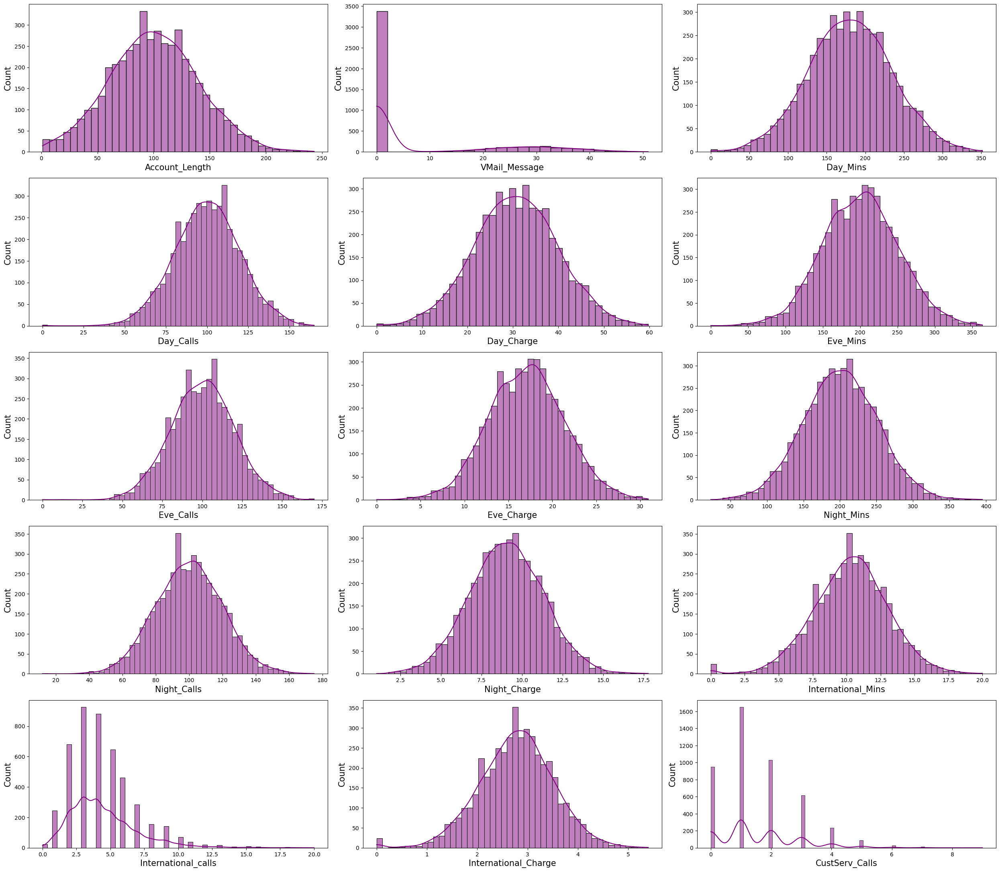

In [28]:
cat_des = ['State','Area_Code','Phone','International_Plan','VMail_Plan','Churn']

plt.figure(figsize=(25,30))
num = 1

for column in data.drop(cat_des, axis=1):
    if num<=21:
        plt.subplot(7, 3, num)
        sns.histplot(data[column], kde=True, color='purple')
        plt.xlabel(column,fontsize=15)
        plt.ylabel('Count',fontsize=15)
        plt.xticks(fontsize=10)
        plt.yticks(fontsize=10)
    num+=1

plt.tight_layout()
plt.show()

## Insight :-
This image contains multiple histograms representing the distribution of various numerical features in a dataset. Here are some key insights based on the distributions:

1. **Normal Distributions:**  
   - Features such as `Account_Length`, `Day_Mins`, `Day_Charge`, `Eve_Mins`, `Eve_Charge`, `Night_Mins`, and `Night_Charge` appear to follow a normal distribution. This suggests that most values are concentrated around the mean, with fewer extreme values.

2. **Skewed Distributions:**  
   - `Vmail_Message` and `International_Calls` exhibit a right-skewed distribution, indicating that most values are clustered towards the lower range, with a few higher values.

3. **Discrete and Sparse Data:**  
   - `CustServ_Calls` shows distinct peaks at specific values, suggesting that customer service calls occur in specific patterns rather than continuously.

4. **Bimodal Distribution:**  
   - `Eve_Calls` and `Night_Calls` display bimodal patterns, which may indicate the presence of two different user groups or calling behaviors.

5. **Outliers and Anomalies:**  
   - Some features, such as `CustServ_Calls` and `Vmail_Message`, have clear spikes at certain values, indicating that customers may follow specific behaviors, such as calling customer service a fixed number of times or having a common voicemail message count.

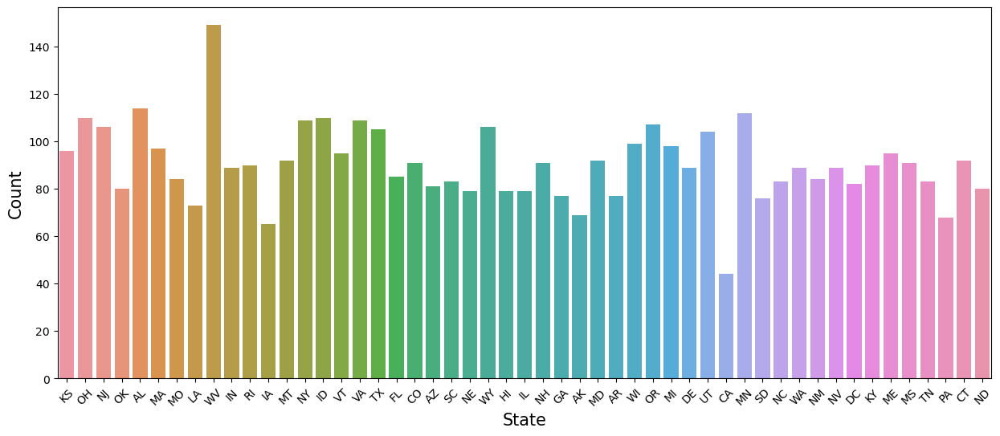

In [31]:
plt.figure(figsize=(15,6))
sns.countplot(x=data['State'])
plt.xlabel('State',fontsize=15)
plt.ylabel('Count',fontsize=15)
plt.xticks(rotation=45)
plt.show()

## Insight :-

* The customer distribution across states shows significant variance.

* **WV (West Virginia)** has the highest count of customers.

* States like **MO (Missouri), AL (Alabama), OK (Oklahoma), NJ (New Jersey)**, and **OH (Ohio)** also show higher customer counts.

* Some states, such as **MT (Montana)** and **DE (Delaware)**, have relatively lower customer representation.

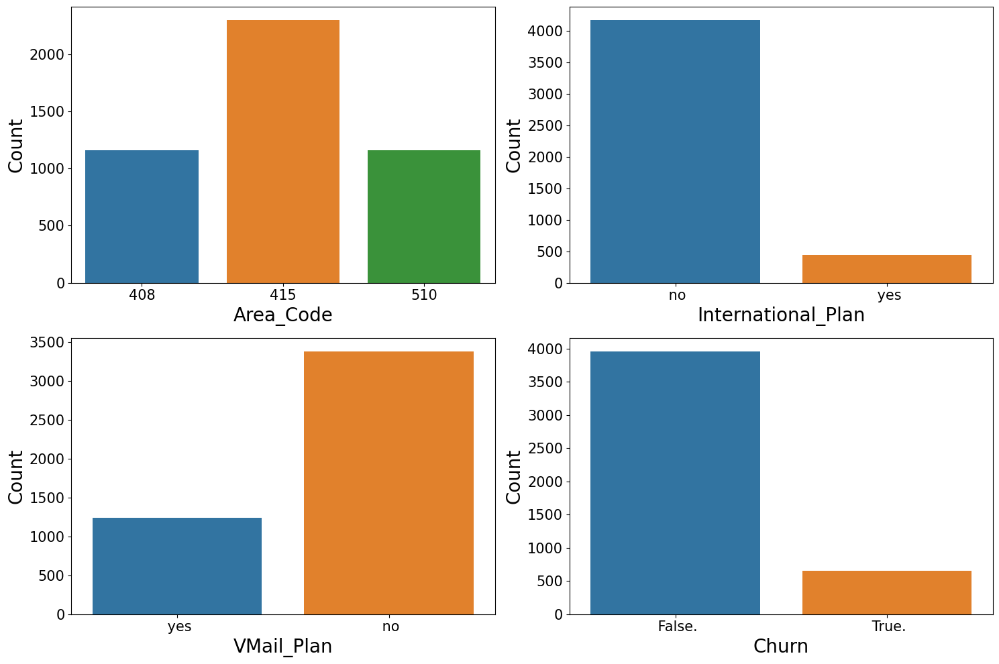

In [33]:
plt.figure(figsize=(15,10))
num = 1

for column in ['Area_Code','International_Plan','VMail_Plan','Churn']:
    if num<=4:
        plt.subplot(2, 2, num)
        sns.countplot(x = data[column])
        plt.xlabel(column,fontsize=20)
        plt.ylabel('Count',fontsize=20)
        plt.xticks(fontsize=15)
        plt.yticks(fontsize=15)
    num+=1

plt.tight_layout()
plt.show()

## Insight :-
* **Area Code Distribution:** Area code `415` has the highest count, while `408` and `510` are lower and almost similar.
* **International Plan:** A large majority of customers do not have an international plan, indicating it might not be widely adopted.
* **Voicemail Plan:** Most customers do not have a voicemail plan, suggesting a possible trend or lack of demand for this feature.
* **Churn Analysis:** The churn rate is quite low, as most customers have not churned (False), which is a positive indicator for customer retention.

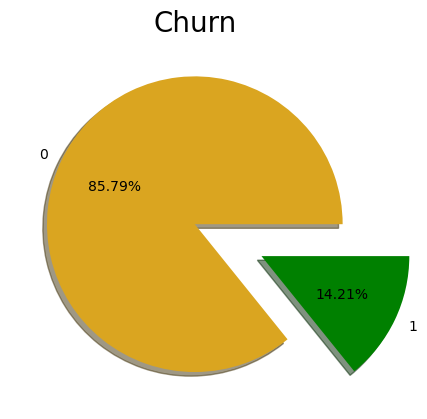

In [35]:
plt.pie(data["Churn"].value_counts(),labels=[0,1] ,autopct='%1.2f%%' ,explode=(0,0.5) ,shadow=True,colors = ['goldenrod', 'green'])
plt.title('Churn',fontsize = 20)
plt.show()

## Insight :-
1. **Imbalanced Data:**  
   - The majority class (0 - Non-Churn) makes up **85.79%** of the dataset.  
   - The minority class (1 - Churn) accounts for only **14.21%**.  

2. **Potential Issues for Modeling:**  
   - Since the dataset is highly imbalanced, predictive models may be biased toward the majority class, leading to poor recall for churn prediction.  
   - Techniques such as **resampling (oversampling the minority class or undersampling the majority class), cost-sensitive learning, or using metrics like AUC-ROC** should be considered to handle this imbalance.


---
## 2) Bivariate Analysis

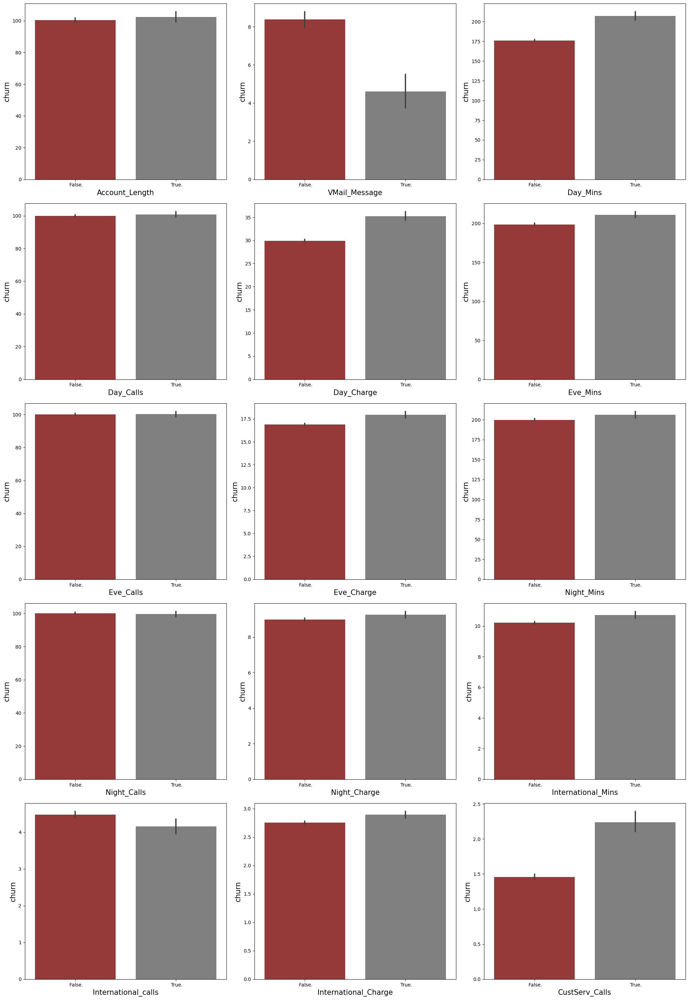

In [38]:
plt.figure(figsize=(20,40))
num = 1

for column in data.drop(cat_des, axis=1):
    if num<=21:
        plt.subplot(7, 3, num)
        sns.barplot(x=data['Churn'], y=data[column], palette=['brown', 'grey'])
        plt.xlabel(column,fontsize=15)
        plt.ylabel('churn',fontsize=15)
        plt.xticks(fontsize=10)
        plt.yticks(fontsize=10)
    num+=1

plt.tight_layout()
plt.show()

## Insight :-

* **1. Account_Length:** There is no significant difference in churn rate between shorter and longer account lengths, indicating that the duration of a customer's association with the service provider may not be a strong predictor of churn.

* **2. VMail_Message:** Customers with voicemail messages enabled have a lower churn rate. Offering or promoting voicemail services could be a strategy to reduce churn.

* **3. Day_Mins:** Higher day minutes are associated with a higher churn rate. Customers who use the service more during the day might be more likely to leave, possibly due to dissatisfaction with call quality or cost.

* **4. Day_Calls:** Similar to account length, the number of calls made during the day does not significantly affect churn, suggesting that call volume is not a strong churn predictor.

* **5. Day_Charge:** Higher day charges lead to a higher churn rate, aligning with the observation for day minutes. High costs may drive customers away.

* **6. Eve_Mins:** Evening minutes show a similar trend as day minutes, where higher usage corresponds to higher churn. This might indicate that heavy users are more likely to switch to a different provider.

* **7. Eve_Calls vs. Churn**

    * Similar to day calls, the number of evening calls does not appear to have a strong correlation with churn.

    * Both categories (True/False) have almost identical churn rates.

* **8. Eve_Charge vs. Churn**

    * There is a small increase in churn for customers with a higher evening charge (True).

    * This suggests that high evening charges may contribute to customer dissatisfaction and churn.

* **9. Eve_Mins vs. Churn**

    * Customers with more evening minutes (True) show a slightly higher churn rate.

    * This might indicate that heavy evening usage contributes to churn, potentially due to cost concerns.

* **10. Night_Mins vs. Churn**

    * The churn rate appears slightly higher for customers with more night minutes (True).

    * This could mean that users with high night-time usage are more likely to churn, possibly due to pricing or service dissatisfaction.

* **11. Night_Calls and Night_Charge:** There is no clear impact of night calls and charges on churn. Nighttime usage patterns do not seem to influence customer retention.

* **12. International_Mins:** Higher international minutes slightly increase churn, which could suggest that international callers may be looking for better international calling plans elsewhere.

* **13. International_Calls:** Fewer international calls seem to correlate with higher churn, which might indicate that customers with fewer international needs are not finding enough value in the service.

* **14. International_Charge:** Similar to international minutes, higher charges do not significantly impact churn, showing that pricing for international calls might not be a major factor in customer decisions.

* **15. CustServ_Calls:** A higher number of customer service calls is strongly associated with a higher churn rate. This is a critical insight, as it indicates customer dissatisfaction. Improving customer service quality and issue resolution could help reduce churn.

#### **Overall Recommendations:**
* Focus on reducing charges or offering better plans for heavy day and evening users.
* Improve customer service experience to prevent churn from dissatisfied customers.
* Promote services like voicemail to enhance customer retention.
* Evaluate pricing strategies, especially for heavy users and international callers, to remain competitive.

---
## 3) Multivariate Analysis

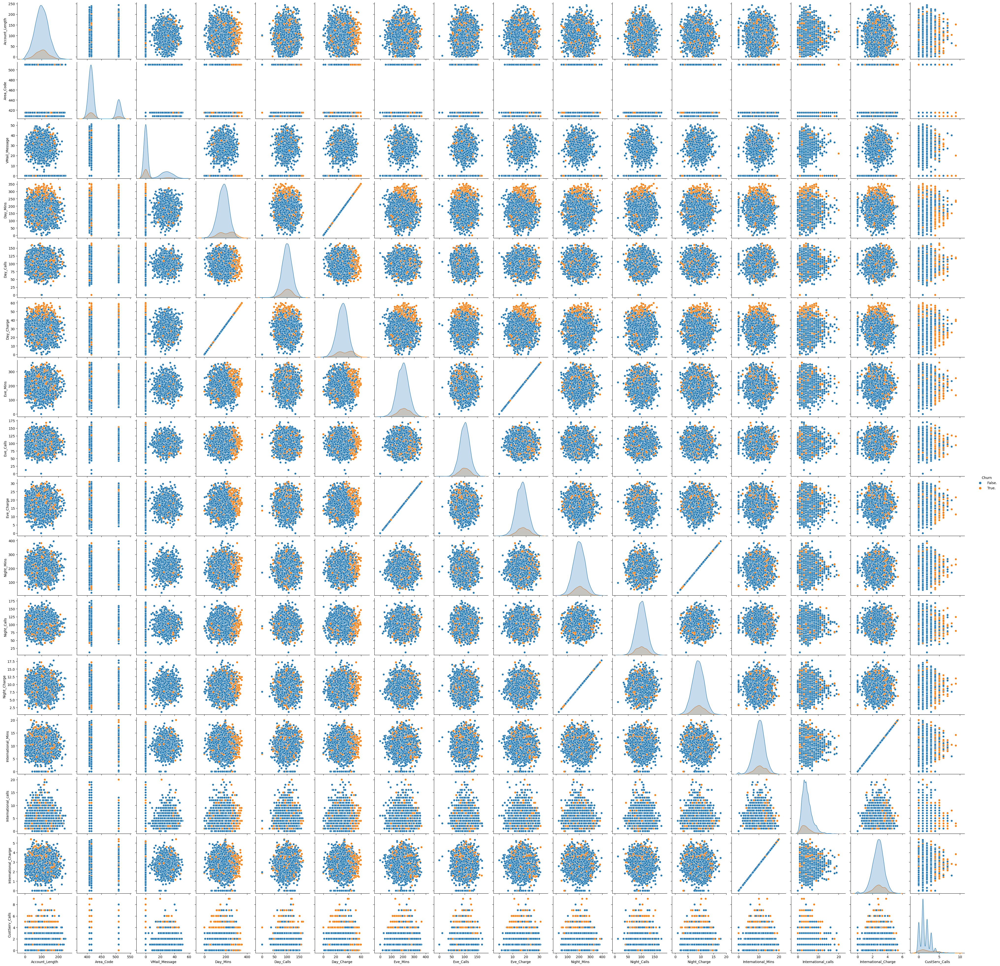

In [55]:
sns.pairplot(data, hue='Churn')
plt.show()

## Insight :-
1. **Strong Correlations Among Related Features**  
   - Features like `Day_Mins` and `Day_Charge`, `Eve_Mins` and `Eve_Charge`, `Night_Mins` and `Night_Charge` show a **strong linear correlation** (as expected).  
   - **Actionable Insight:** Since charges are derived from minutes, including both in a model could lead to redundancy. Feature selection techniques (like removing highly correlated features) can improve model performance.

2. **Churned Customers Tend to Have Higher Usage**  
   - Churned customers (orange dots) are **more concentrated in the higher range of `Day_Mins`, `Eve_Mins`, and `International_Mins`**.  
   - **Actionable Insight:** Heavy users might be more price-sensitive. Offering personalized discounts, loyalty rewards, or better plans could reduce churn.

3. **Customer Service Calls (`CustServ_Calls`) Stand Out**  
   - A **clear pattern is visible where high `CustServ_Calls` is associated with churn**.  
   - **Actionable Insight:** High customer service interactions indicate dissatisfaction. Implement **proactive customer engagement** to address concerns early.

4. **Voicemail Usage and Churn**  
   - Customers using voicemail services (`Vmail_Message`) seem **less likely to churn**.  
   - **Actionable Insight:** Encouraging voicemail adoption via promotions or free trials may help retain customers.

5. **International Calls Have an Influence**  
   - Some churned customers show **higher international call minutes and charges**.  
   - **Actionable Insight:** Offering better international call rates for high-usage customers may improve retention.

### Next Steps:
- **Feature Engineering:** Remove redundant variables like `Charge` features since they are directly derived from `Mins`.  
- **Proactive Customer Retention:** Identify high `CustServ_Calls` customers early and offer solutions before they churn.  
- **Personalized Plans:** Create offers for high-usage customers, particularly those with high `International_Mins`.  
- **Voicemail Promotion:** Encourage voicemail feature adoption as a churn-prevention strategy.  

In [49]:
from IPython.display import IFrame

# Display PDF in Jupyter Notebook
IFrame("customer churn dashboard.pdf", width=1080, height=680)

The purpose of this report is to analyze customer churn using the insights provided in the 'Customer
Churn Rate Dashboard' generated through Power BI. The analysis aims to identify key factors
contributing to churn and provide actionable insights to reduce churn rates.
### **Key Metrics**
   * **Total Customers:** 4,617
   * **Total Churned Customers:** 656
   * **Customer Churn Rate:** 14%
   * **Average Calls Per Day:** 300
   * **Average Charges for International Calls:** 2.78
### **Analysis**
**Churn by Voice Mail Plan**
* Customers without a Vo**ice Mail Plan account for 85% of churn (559 customers), while those
with a Voice Mail Plan account for 15% (97 customers).

**Churn by International Plan**
* 72% of churned customers do not have an International Plan (470 customers), while 28% do
(186 customers).

**Churn by State**
* The highest churn is observed in states such as NJ, TX, WA, WV, and MD.
* States with higher call volumes per day include WV, NJ, TX, MD, and WA.
Customer Churn Rate Report\

**Conclusion**
* The absence of a Voice Mail Plan significantly correlates with higher churn rates.
* Customers without an International Plan are also more likely to churn.
* Specific states demonstrate higher churn, suggesting potential regional issues or opportunities
for targeted retention strategies.

**Recommendations**
* Introduce promotional offers for Voice Mail Plans and International Plans to reduce churn.
* Develop targeted retention campaigns in high-churn states.
* Enhance customer service and engagement strategies, particularly for regions and plans with
higher churn.

---
# **Feature Engineering:**
---

## 1) Data Preprocessing

In [47]:
data.isnull().sum()

State                   0
Account_Length          0
Area_Code               0
Phone                   0
International_Plan      0
VMail_Plan              0
VMail_Message           0
Day_Mins                0
Day_Calls               0
Day_Charge              0
Eve_Mins                0
Eve_Calls               0
Eve_Charge              0
Night_Mins              0
Night_Calls             0
Night_Charge            0
International_Mins      0
International_calls     0
International_Charge    0
CustServ_Calls          0
Churn                   0
dtype: int64

In [48]:
data.duplicated().sum()

0

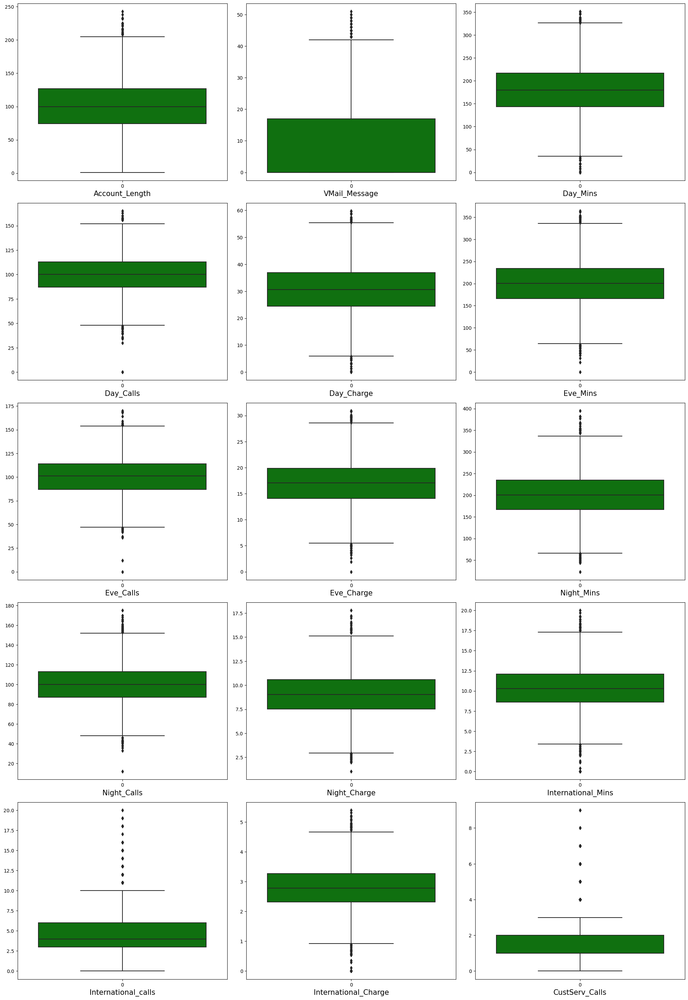

In [49]:
cat_des = ['State','Area_Code','Phone','International_Plan','VMail_Plan','Churn']

plt.figure(figsize=(20,40))
num = 1

for column in data.drop(cat_des, axis=1):
    if num<=21:
        plt.subplot(7, 3, num)
        sns.boxplot(data[column], color='green')
        plt.xlabel(column,fontsize=15)
        plt.xticks(fontsize=10)
        plt.yticks(fontsize=10)
    num+=1

plt.tight_layout()
plt.show()

In [50]:
for column in data.drop(cat_des, axis=1):
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3-Q1
    upper_boundry = Q3+1.5*IQR
    lover_boundry = Q1-1.5*IQR
    if column == 'VMail_Message':
        data.loc[data[column]>upper_boundry,column] = np.median(data[column])
    elif column in ['CustServ_Calls','International_calls']:
        continue
    else:
        data.loc[data[column]>upper_boundry,column] = np.mean(data[column])
        data.loc[data[column]<lover_boundry,column] = np.mean(data[column])

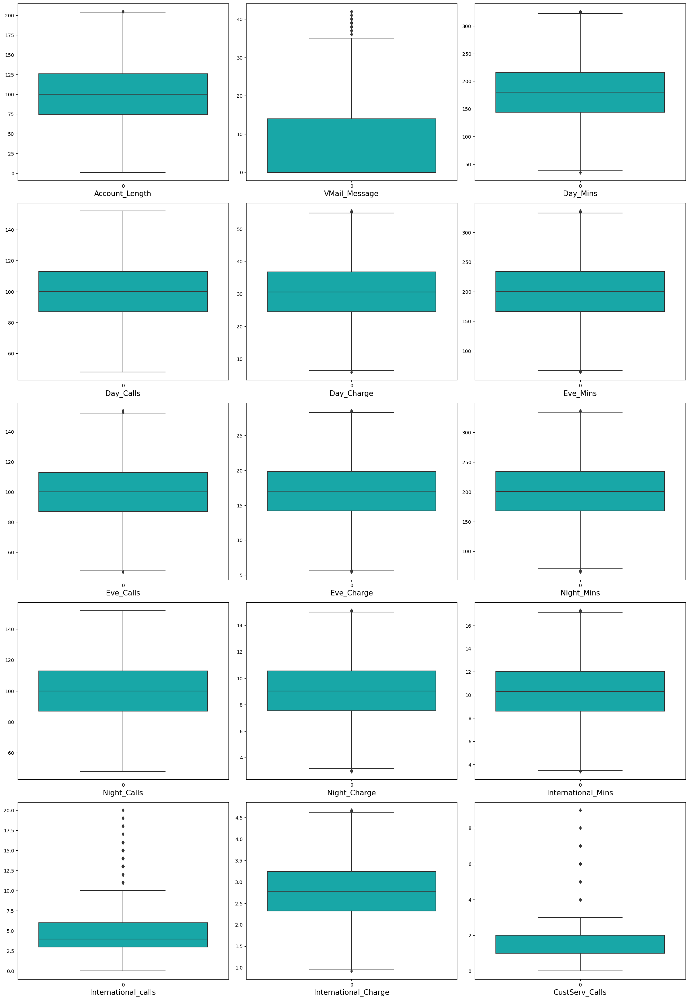

In [51]:
cat_des = ['State','Area_Code','Phone','International_Plan','VMail_Plan','Churn']

plt.figure(figsize=(20,40))
num = 1

for column in data.drop(cat_des, axis=1):
    if num<=21:
        plt.subplot(7, 3, num)
        sns.boxplot(data[column], color='c')
        plt.xlabel(column,fontsize=15)
        plt.xticks(fontsize=10)
        plt.yticks(fontsize=10)
    num+=1

plt.tight_layout()
plt.show()

In [52]:
le_column = ['State','International_Plan','VMail_Plan','Churn']

In [53]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

In [54]:
for col in le_column:
    data[col] = le.fit_transform(data[col])

In [55]:
# state_data = pd.get_dummies(data['State'], dtype='int')
data

,State,Account_Length,Area_Code,Phone,International_Plan,VMail_Plan,VMail_Message,Day_Mins,Day_Calls,Day_Charge,Eve_Mins,Eve_Calls,Eve_Charge,Night_Mins,Night_Calls,Night_Charge,International_Mins,International_calls,International_Charge,CustServ_Calls,Churn
0,16,128.0,415,382-4657,0,1,25,265.1,110.0,45.07,197.400000,99.0,16.780000,244.7,91.0,11.01,10.0,3,2.70,1,0
1,35,107.0,415,371-7191,0,1,26,161.6,123.0,27.47,195.500000,103.0,16.620000,254.4,103.0,11.45,13.7,3,3.70,1,0
2,31,137.0,415,358-1921,0,0,0,243.4,114.0,41.38,121.200000,110.0,10.300000,162.6,104.0,7.32,12.2,5,3.29,0,0
3,35,84.0,408,375-9999,1,0,0,299.4,71.0,50.90,199.913768,88.0,16.992902,196.9,89.0,8.86,6.6,7,1.78,2,0
4,36,75.0,415,330-6626,1,0,0,166.7,113.0,28.34,148.300000,122.0,12.610000,186.9,121.0,8.41,10.1,3,2.73,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4612,34,57.0,510,345-7512,0,1,25,144.0,81.0,24.48,187.200000,112.0,15.910000,158.6,122.0,7.14,8.5,6,2.30,3,0
4613,32,177.0,408,343-6820,0,1,29,189.0,91.0,32.13,303.100000,96.0,25.760000,163.6,116.0,7.36,15.7,1,4.24,3,0
4614,46,67.0,408,338-4794,0,1,33,127.5,126.0,21.68,296.100000,129.0,25.170000,200.9,91.0,9.04,13.0,3,3.51,1,0
4615,22,98.0,415,355-8388,0,1,23,168.9,98.0,28.71,226.300000,117.0,19.240000,165.5,96.0,7.45,14.3,3,3.86,0,0


In [56]:
# final_data = pd.concat([state_data, data], axis=1)

In [57]:
countinue_col = ['Account_Length', 'VMail_Message', 'Day_Mins', 'Day_Calls', 'Day_Charge', 'Eve_Mins', 'Eve_Calls',
                 'Eve_Charge', 'Night_Mins', 'Night_Calls','Night_Charge', 'International_Mins', 'International_Charge',]
from sklearn.preprocessing import MinMaxScaler
mms = MinMaxScaler()

In [58]:
data[countinue_col] = mms.fit_transform(data[countinue_col])

In [59]:
data

,State,Account_Length,Area_Code,Phone,International_Plan,VMail_Plan,VMail_Message,Day_Mins,Day_Calls,Day_Charge,Eve_Mins,Eve_Calls,Eve_Charge,Night_Mins,Night_Calls,Night_Charge,International_Mins,International_calls,International_Charge,CustServ_Calls,Churn
0,16,0.622549,415,382-4657,0,1,0.595238,0.789835,0.596154,0.789899,0.489879,0.485981,0.489822,0.661982,0.413462,0.662007,0.474820,3,0.474667,1,0
1,35,0.519608,415,371-7191,0,1,0.619048,0.434409,0.721154,0.434343,0.482886,0.523364,0.482893,0.697855,0.528846,0.698191,0.741007,3,0.741333,1,0
2,31,0.666667,415,358-1921,0,0,0.000000,0.715316,0.634615,0.715354,0.209422,0.588785,0.209181,0.358358,0.538462,0.358553,0.633094,5,0.632000,0,0
3,35,0.406863,408,375-9999,1,0,0.000000,0.907624,0.221154,0.907677,0.499131,0.383178,0.499043,0.485207,0.394231,0.485197,0.230216,7,0.229333,2,0
4,36,0.362745,415,330-6626,1,0,0.000000,0.451923,0.625000,0.451919,0.309165,0.700935,0.309225,0.448225,0.701923,0.448191,0.482014,3,0.482667,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4612,34,0.274510,510,345-7512,0,1,0.595238,0.373970,0.317308,0.373939,0.452337,0.607477,0.452144,0.343565,0.711538,0.343750,0.366906,6,0.368000,3,0
4613,32,0.862745,408,343-6820,0,1,0.690476,0.528503,0.413462,0.528485,0.878911,0.457944,0.878735,0.362056,0.653846,0.361842,0.884892,1,0.885333,3,0
4614,46,0.323529,408,338-4794,0,1,0.785714,0.317308,0.750000,0.317374,0.853147,0.766355,0.853183,0.500000,0.413462,0.500000,0.690647,3,0.690667,1,0
4615,22,0.475490,415,355-8388,0,1,0.547619,0.459478,0.480769,0.459394,0.596246,0.654206,0.596362,0.369083,0.461538,0.369243,0.784173,3,0.784000,0,0


## 2) Feature selection

In [61]:
cr_col = ['Account_Length', 'Area_Code', 'International_Plan', 'VMail_Plan', 'VMail_Message', 'Day_Mins', 'Day_Calls',
          'Day_Charge', 'Eve_Mins', 'Eve_Calls', 'Eve_Charge', 'Night_Mins', 'Night_Calls', 'Night_Charge',
          'International_Mins', 'International_calls', 'International_Charge', 'CustServ_Calls', 'Churn']

In [62]:
data[cr_col].corr()

,Account_Length,Area_Code,International_Plan,VMail_Plan,VMail_Message,Day_Mins,Day_Calls,Day_Charge,Eve_Mins,Eve_Calls,Eve_Charge,Night_Mins,Night_Calls,Night_Charge,International_Mins,International_calls,International_Charge,CustServ_Calls,Churn
Account_Length,1.000000,-0.022744,0.016974,0.000154,-0.009681,-0.002189,0.031307,-0.002193,-0.010545,0.022094,-0.010538,-0.005901,-0.005702,-0.005920,0.021315,0.023777,0.021326,0.000797,0.015519
Area_Code,-0.022744,1.000000,0.039263,-0.003150,0.000568,-0.022256,-0.014019,-0.022259,0.004262,-0.009815,0.004283,0.003674,0.007919,0.003662,-0.007091,-0.011531,-0.007202,0.021046,0.011995
International_Plan,0.016974,0.039263,1.000000,0.009278,0.009662,0.026373,0.007383,0.026376,0.018915,0.000866,0.018916,-0.031569,0.009960,-0.031575,0.030537,0.006717,0.030521,-0.012846,0.257524
VMail_Plan,0.000154,-0.003150,0.009278,1.000000,0.933469,0.011325,-0.005971,0.011324,0.019212,-0.008248,0.019216,0.000024,0.012557,0.000018,0.000178,-0.000043,0.000215,-0.014544,-0.110149
VMail_Message,-0.009681,0.000568,0.009662,0.933469,1.000000,0.015697,-0.010013,0.015693,0.024543,-0.006126,0.024544,-0.000844,0.001877,-0.000852,0.005831,0.013140,0.005857,-0.003174,-0.096228
Day_Mins,-0.002189,-0.022256,0.026373,0.011325,0.015697,1.000000,0.006471,1.000000,-0.006335,0.009081,-0.006345,-0.003919,-0.000059,-0.003935,-0.013226,-0.007431,-0.013179,-0.007445,0.185510
Day_Calls,0.031307,-0.014019,0.007383,-0.005971,-0.010013,0.006471,1.000000,0.006474,-0.003684,0.017483,-0.003680,0.015987,-0.007143,0.015981,0.007106,0.005703,0.007238,-0.012846,0.018304
Day_Charge,-0.002193,-0.022259,0.026376,0.011324,0.015693,1.000000,0.006474,1.000000,-0.006331,0.009082,-0.006340,-0.003918,-0.000061,-0.003933,-0.013227,-0.007433,-0.013180,-0.007451,0.185505
Eve_Mins,-0.010545,0.004262,0.018915,0.019212,0.024543,-0.006335,-0.003684,-0.006331,1.000000,-0.009554,1.000000,-0.025913,0.008170,-0.025927,-0.000492,0.012462,-0.000476,-0.022843,0.077594
Eve_Calls,0.022094,-0.009815,0.000866,-0.008248,-0.006126,0.009081,0.017483,0.009082,-0.009554,1.000000,-0.009543,0.015666,-0.015723,0.015681,-0.006574,0.006217,-0.006592,0.010478,-0.002514


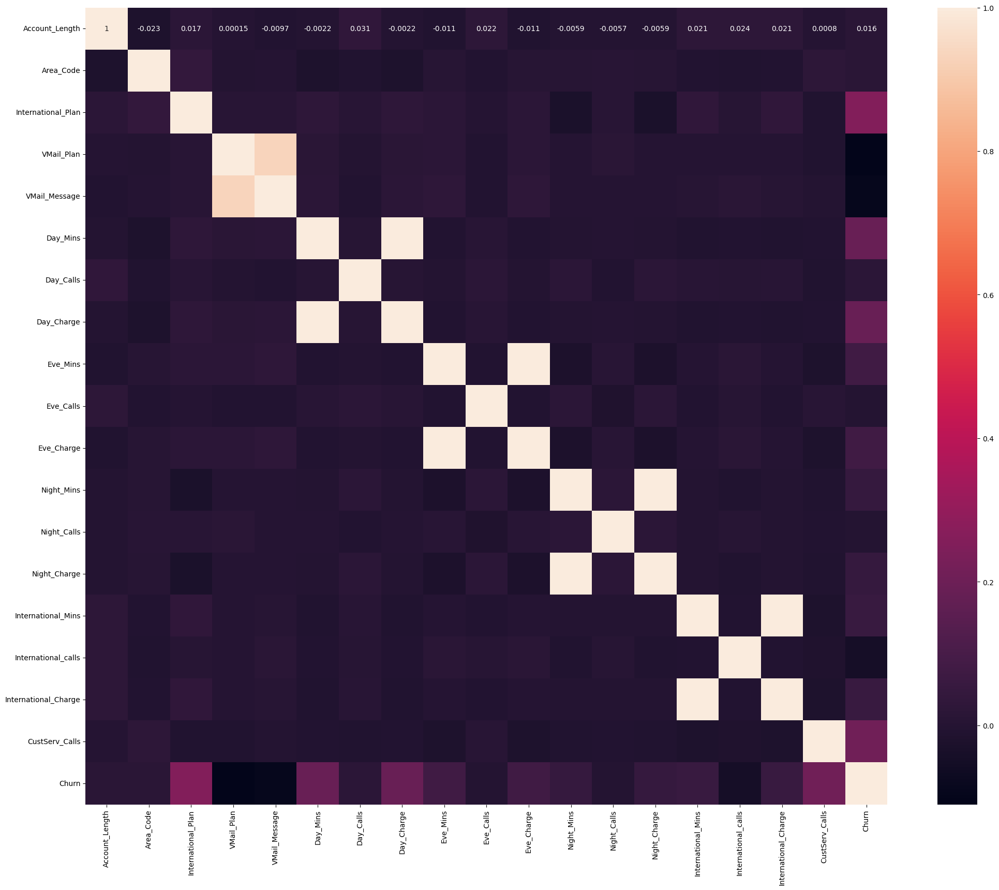

In [63]:
plt.figure(figsize=(25,20))
sns.heatmap(data[cr_col].corr(), annot=True)
plt.show()

In [64]:
dr_col = ['State','Phone','VMail_Message','Day_Charge','Eve_Charge','Night_Charge','International_Mins']

data.drop(dr_col, axis=1, inplace=True)

---
# **Model Creation:** 
---

## 1) Independent and Dependent Variable Creation

In [67]:
x = data.drop('Churn', axis=1)
y = data['Churn']

In [68]:
x

,Account_Length,Area_Code,International_Plan,VMail_Plan,Day_Mins,Day_Calls,Eve_Mins,Eve_Calls,Night_Mins,Night_Calls,International_calls,International_Charge,CustServ_Calls
0,0.622549,415,0,1,0.789835,0.596154,0.489879,0.485981,0.661982,0.413462,3,0.474667,1
1,0.519608,415,0,1,0.434409,0.721154,0.482886,0.523364,0.697855,0.528846,3,0.741333,1
2,0.666667,415,0,0,0.715316,0.634615,0.209422,0.588785,0.358358,0.538462,5,0.632000,0
3,0.406863,408,1,0,0.907624,0.221154,0.499131,0.383178,0.485207,0.394231,7,0.229333,2
4,0.362745,415,1,0,0.451923,0.625000,0.309165,0.700935,0.448225,0.701923,3,0.482667,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4612,0.274510,510,0,1,0.373970,0.317308,0.452337,0.607477,0.343565,0.711538,6,0.368000,3
4613,0.862745,408,0,1,0.528503,0.413462,0.878911,0.457944,0.362056,0.653846,1,0.885333,3
4614,0.323529,408,0,1,0.317308,0.750000,0.853147,0.766355,0.500000,0.413462,3,0.690667,1
4615,0.475490,415,0,1,0.459478,0.480769,0.596246,0.654206,0.369083,0.461538,3,0.784000,0


In [69]:
y

0       0
1       0
2       0
3       0
4       0
       ..
4612    0
4613    0
4614    0
4615    0
4616    0
Name: Churn, Length: 4617, dtype: int32

## 2) Traning and Testing Data Creation

In [71]:
from sklearn.model_selection import train_test_split

In [72]:
x_train,x_test,y_train,y_test = train_test_split(x, y, test_size=0.25, random_state=1)

In [73]:
x_train

,Account_Length,Area_Code,International_Plan,VMail_Plan,Day_Mins,Day_Calls,Eve_Mins,Eve_Calls,Night_Mins,Night_Calls,International_calls,International_Charge,CustServ_Calls
3689,0.578431,415,0,0,0.327610,0.480769,0.681634,0.411215,0.570266,0.663462,1,0.669333,3
1159,0.622549,415,0,0,0.234203,0.711538,0.668384,0.710280,0.352811,0.451923,7,0.216000,0
367,0.215686,415,0,0,0.148008,0.759615,0.695988,0.570093,0.700074,0.500000,3,0.494914,1
2910,0.598039,415,0,0,0.482830,0.288462,0.442768,0.457944,0.337278,0.423077,2,0.410667,2
3732,0.514706,510,0,0,0.431662,0.240385,0.390504,0.607477,0.678624,0.798077,3,0.272000,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2895,0.156863,415,1,0,0.442651,0.490385,0.326831,0.514019,0.214867,0.538462,4,0.216000,0
2763,0.563725,408,0,1,0.414148,0.538462,0.445712,0.663551,0.469675,0.653846,2,0.344000,3
905,0.784314,415,0,0,0.538462,0.625000,0.024291,0.373832,0.514423,0.567308,4,0.720000,4
3980,0.264706,510,0,0,0.502060,0.500000,0.501288,0.700935,0.596154,0.490385,2,0.538667,1


In [74]:
y_train

3689    0
1159    0
367     0
2910    0
3732    0
       ..
2895    0
2763    0
905     1
3980    0
235     1
Name: Churn, Length: 3462, dtype: int32

In [75]:
x_test

,Account_Length,Area_Code,International_Plan,VMail_Plan,Day_Mins,Day_Calls,Eve_Mins,Eve_Calls,Night_Mins,Night_Calls,International_calls,International_Charge,CustServ_Calls
3521,0.681373,415,0,1,0.483860,0.894231,0.504233,0.897196,0.377959,0.432692,5,0.266667,3
190,0.519608,415,0,0,0.338942,0.355769,0.427678,0.439252,0.171967,0.644231,4,0.394667,0
703,0.794118,510,0,1,0.428915,0.538462,0.460434,0.158879,0.607249,0.673077,7,0.504000,1
4312,0.436275,415,0,0,0.814217,0.259615,0.215679,0.457944,0.691198,0.500000,2,0.416000,0
2079,0.593137,415,0,0,0.683379,0.509615,0.500184,0.691589,0.634985,0.394231,9,0.698667,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3431,0.250000,408,0,1,0.299107,0.384615,0.274936,0.495327,0.281805,0.894231,10,0.165333,3
3345,0.495098,415,0,0,0.662775,0.365385,0.337505,0.467290,0.599852,0.730769,9,0.517333,1
3767,0.387255,510,0,0,0.418956,0.278846,0.874862,0.205607,0.932692,0.499463,4,0.877333,0
2142,0.485294,415,0,0,0.210852,0.365385,0.536989,0.803738,0.298447,0.557692,3,0.656000,1


In [76]:
y_test

3521    0
190     0
703     0
4312    0
2079    0
       ..
3431    0
3345    0
3767    0
2142    1
580     1
Name: Churn, Length: 1155, dtype: int32

## Balancing the data

### SMOTE

In [11]:
from imblearn.over_sampling import SMOTE

smote = SMOTE(random_state=34)

x_train_smote, y_train_smote = smote.fit_resample(x_train,y_train)

NameError: name 'x_train' is not defined

In [80]:
x_train_smote

,Account_Length,Area_Code,International_Plan,VMail_Plan,Day_Mins,Day_Calls,Eve_Mins,Eve_Calls,Night_Mins,Night_Calls,International_calls,International_Charge,CustServ_Calls
0,0.578431,415,0,0,0.327610,0.480769,0.681634,0.411215,0.570266,0.663462,1,0.669333,3
1,0.622549,415,0,0,0.234203,0.711538,0.668384,0.710280,0.352811,0.451923,7,0.216000,0
2,0.215686,415,0,0,0.148008,0.759615,0.695988,0.570093,0.700074,0.500000,3,0.494914,1
3,0.598039,415,0,0,0.482830,0.288462,0.442768,0.457944,0.337278,0.423077,2,0.410667,2
4,0.514706,510,0,0,0.431662,0.240385,0.390504,0.607477,0.678624,0.798077,3,0.272000,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5941,0.689281,415,0,0,0.608669,0.645644,0.570515,0.406081,0.746018,0.518251,3,0.334169,5
5942,0.585138,408,0,0,0.356393,0.408084,0.653465,0.697494,0.527748,0.336686,5,0.558940,4
5943,0.588910,510,0,0,0.356293,0.624561,0.598826,0.542572,0.525617,0.407110,2,0.383680,4
5944,0.425997,415,0,0,0.826541,0.618128,0.505259,0.409062,0.344878,0.537304,4,0.497989,0


In [81]:
y_train_smote

0       0
1       0
2       0
3       0
4       0
       ..
5941    1
5942    1
5943    1
5944    1
5945    1
Name: Churn, Length: 5946, dtype: int32

In [82]:
# Check class distribution before and after SMOTE using Counter
from collections import Counter

print("Before Apply SMOTE->>>> ",Counter(y_train))  # Display original class distribution
print("After Apply SMOTE->>>> ",Counter(y_train_smote))  # Display balanced class distribution


Before Apply SMOTE->>>>  Counter({0: 2973, 1: 489})
After Apply SMOTE->>>>  Counter({0: 2973, 1: 2973})


## 3) Model Selection

In [84]:
from sklearn.metrics import confusion_matrix,accuracy_score,recall_score,precision_score,f1_score,classification_report,roc_curve,auc,roc_auc_score

### * **Logistic Regression**

In [86]:
# Import Logistic Regression Model
from sklearn.linear_model import LogisticRegression

# Initialize and train Logistic Regression model
lr = LogisticRegression()
lr.fit(x_train_smote,y_train_smote)

LogisticRegression()

In [87]:
# Predict on test data
y_pred1 = lr.predict(x_test)
y_pred1  # Display test predictions

array([0, 0, 0, ..., 1, 0, 0])

In [88]:
# Predict on training data
y_train_pred1 = lr.predict(x_train)
y_train_pred1  # Display training predictions

array([1, 0, 0, ..., 1, 0, 1])

In [89]:
# Compute confusion matrix
confusion_matrix(y_test,y_pred1)

array([[750, 238],
       [ 38, 129]], dtype=int64)

In [90]:
# Print classification report for test data
print(classification_report(y_test,y_pred1))

              precision    recall  f1-score   support

           0       0.95      0.76      0.84       988
           1       0.35      0.77      0.48       167

    accuracy                           0.76      1155
   macro avg       0.65      0.77      0.66      1155
weighted avg       0.86      0.76      0.79      1155



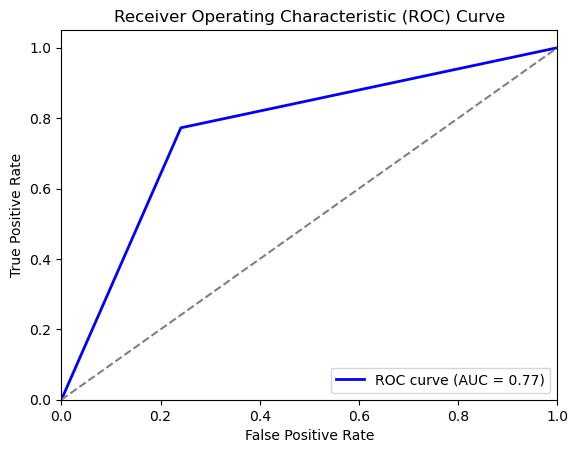

AUC Score: 0.77


In [91]:
fpr, tpr, _ = roc_curve(y_test, y_pred1)
roc_auc = auc(fpr, tpr)

plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='grey', linestyle='--')  # Random classifier line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Print AUC score
print(f"AUC Score: {roc_auc:.2f}")

### * **Support Vector Machine**

In [93]:
# Import Support Vector Machine (SVM) Model
from sklearn.svm import SVC

# Initialize and train SVM model
svc = SVC()
svc.fit(x_train_smote,y_train_smote)

SVC()

In [94]:
# Predict on test data
y_pred2 = svc.predict(x_test)
y_pred2  # Display test predictions

array([0, 0, 1, ..., 1, 0, 0])

In [95]:
# Predict on training data
y_train_pred2 = svc.predict(x_train)
y_train_pred2  # Display training predictions

array([0, 0, 0, ..., 0, 1, 1])

In [96]:
# Compute confusion matrix
confusion_matrix(y_test,y_pred2)

array([[747, 241],
       [119,  48]], dtype=int64)

In [97]:
# Print classification report for test data
print(classification_report(y_test,y_pred2))

              precision    recall  f1-score   support

           0       0.86      0.76      0.81       988
           1       0.17      0.29      0.21       167

    accuracy                           0.69      1155
   macro avg       0.51      0.52      0.51      1155
weighted avg       0.76      0.69      0.72      1155



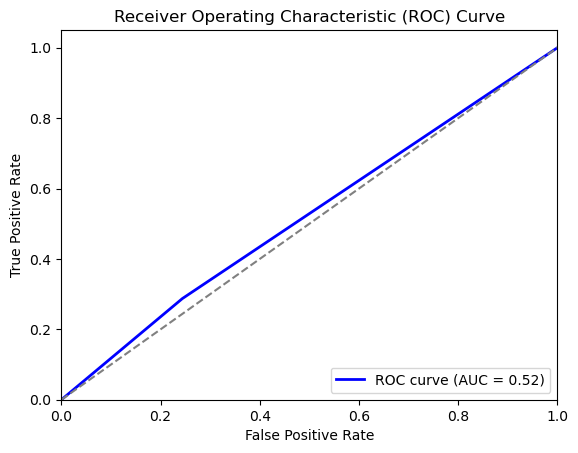

AUC Score: 0.52


In [98]:
fpr, tpr, _ = roc_curve(y_test, y_pred2)
roc_auc = auc(fpr, tpr)

plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='grey', linestyle='--')  # Random classifier line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Print AUC score
print(f"AUC Score: {roc_auc:.2f}")

### * **K-Nearest Neighbor**

In [100]:
# Import K-Nearest Neighbors (KNN) Model
from sklearn.neighbors import KNeighborsClassifier

# Initialize and train KNN model
knnc = KNeighborsClassifier()
knnc.fit(x_train_smote,y_train_smote)

KNeighborsClassifier()

In [101]:
# Predict on test data
y_pred3 = knnc.predict(x_test)
y_pred3  # Display test predictions

array([0, 0, 0, ..., 1, 0, 0])

In [102]:
# Predict on training data
y_train_pred3 = knnc.predict(x_train)
y_train_pred3  # Display training predictions

array([0, 0, 0, ..., 1, 0, 1])

In [103]:
# Compute confusion matrix
confusion_matrix(y_test,y_pred3)

array([[760, 228],
       [ 58, 109]], dtype=int64)

In [104]:
# Print classification report for test data
print(classification_report(y_test,y_pred3))

              precision    recall  f1-score   support

           0       0.93      0.77      0.84       988
           1       0.32      0.65      0.43       167

    accuracy                           0.75      1155
   macro avg       0.63      0.71      0.64      1155
weighted avg       0.84      0.75      0.78      1155



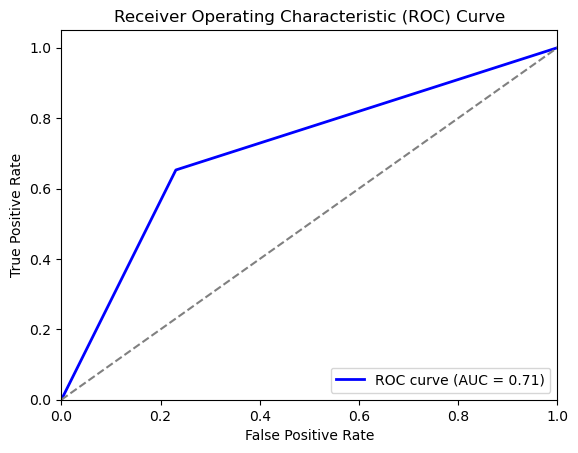

AUC Score: 0.71


In [105]:
fpr, tpr, _ = roc_curve(y_test, y_pred3)
roc_auc = auc(fpr, tpr)

plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='grey', linestyle='--')  # Random classifier line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Print AUC score
print(f"AUC Score: {roc_auc:.2f}")

### * **Decision Tree**

In [107]:
# Import Decision Tree Classifier Model
from sklearn.tree import DecisionTreeClassifier

# Initialize and train Decision Tree model
dtc = DecisionTreeClassifier()
dtc.fit(x_train_smote,y_train_smote)

DecisionTreeClassifier()

In [108]:
# Predict on test data
y_pred4 = dtc.predict(x_test)
y_pred4  # Display test predictions

array([0, 0, 0, ..., 0, 0, 0])

In [109]:
# Predict on training data
y_train_pred4 = dtc.predict(x_train)
y_train_pred4  # Display training predictions

array([0, 0, 0, ..., 1, 0, 1])

In [110]:
# Compute confusion matrix
confusion_matrix(y_test,y_pred4)

array([[847, 141],
       [ 46, 121]], dtype=int64)

In [111]:
# Print classification report for test data
print(classification_report(y_test,y_pred4))

              precision    recall  f1-score   support

           0       0.95      0.86      0.90       988
           1       0.46      0.72      0.56       167

    accuracy                           0.84      1155
   macro avg       0.71      0.79      0.73      1155
weighted avg       0.88      0.84      0.85      1155



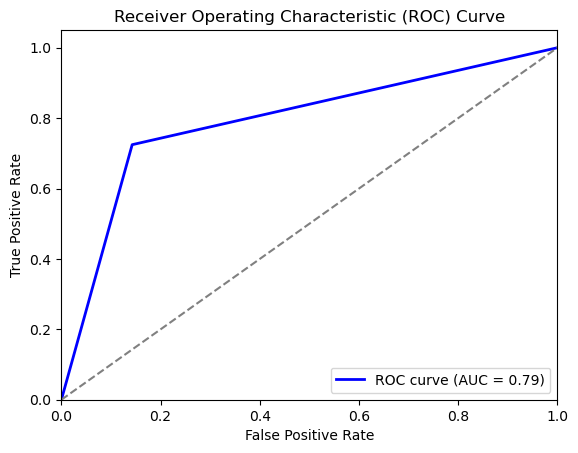

AUC Score: 0.79


In [112]:
fpr, tpr, _ = roc_curve(y_test, y_pred4)
roc_auc = auc(fpr, tpr)

plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='grey', linestyle='--')  # Random classifier line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Print AUC score
print(f"AUC Score: {roc_auc:.2f}")

### * **Bagging**

In [114]:
# Import Bagging Classifier Model
from sklearn.ensemble import BaggingClassifier

# Initialize and train Bagging Classifier model
bc = BaggingClassifier()
bc.fit(x_train_smote,y_train_smote)

BaggingClassifier()

In [115]:
# Predict on test data
y_pred5 = bc.predict(x_test)
y_pred5  # Display test predictions

array([0, 0, 0, ..., 0, 0, 0])

In [116]:
# Predict on training data
y_train_pred5 = bc.predict(x_train)
y_train_pred5  # Display training predictions

array([0, 0, 0, ..., 1, 0, 1])

In [117]:
# Compute confusion matrix
confusion_matrix(y_test,y_pred5)

array([[920,  68],
       [ 48, 119]], dtype=int64)

In [118]:
# Print classification report for test data
print(classification_report(y_test,y_pred5))

              precision    recall  f1-score   support

           0       0.95      0.93      0.94       988
           1       0.64      0.71      0.67       167

    accuracy                           0.90      1155
   macro avg       0.79      0.82      0.81      1155
weighted avg       0.91      0.90      0.90      1155



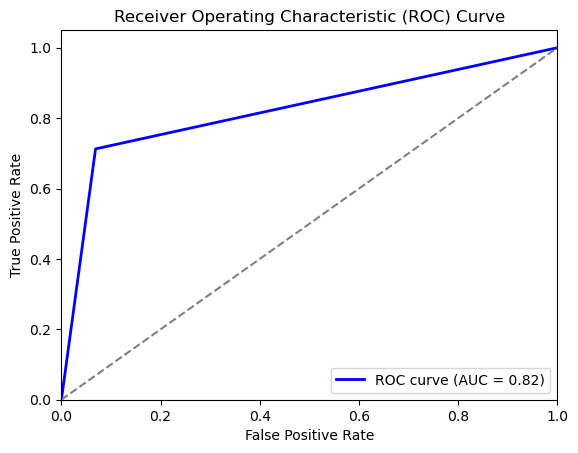

AUC Score: 0.82


In [119]:
fpr, tpr, _ = roc_curve(y_test, y_pred5)
roc_auc = auc(fpr, tpr)

plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='grey', linestyle='--')  # Random classifier line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Print AUC score
print(f"AUC Score: {roc_auc:.2f}")

### * **AdaBoost**

In [121]:
# Import AdaBoost Classifier Model
from sklearn.ensemble import AdaBoostClassifier

# Initialize and train AdaBoost Classifier model
abc = AdaBoostClassifier()
abc.fit(x_train_smote,y_train_smote)

AdaBoostClassifier()

In [122]:
# Predict on test data
y_pred6 = abc.predict(x_test)
y_pred6  # Display test predictions

array([0, 0, 0, ..., 0, 0, 0])

In [123]:
# Predict on training data
y_train_pred6 = abc.predict(x_train)
y_train_pred6  # Display training predictions

array([1, 0, 0, ..., 1, 0, 1])

In [124]:
# Compute confusion matrix
confusion_matrix(y_test,y_pred6)

array([[824, 164],
       [ 56, 111]], dtype=int64)

In [125]:
# Print classification report for test data
print(classification_report(y_test,y_pred6))

              precision    recall  f1-score   support

           0       0.94      0.83      0.88       988
           1       0.40      0.66      0.50       167

    accuracy                           0.81      1155
   macro avg       0.67      0.75      0.69      1155
weighted avg       0.86      0.81      0.83      1155



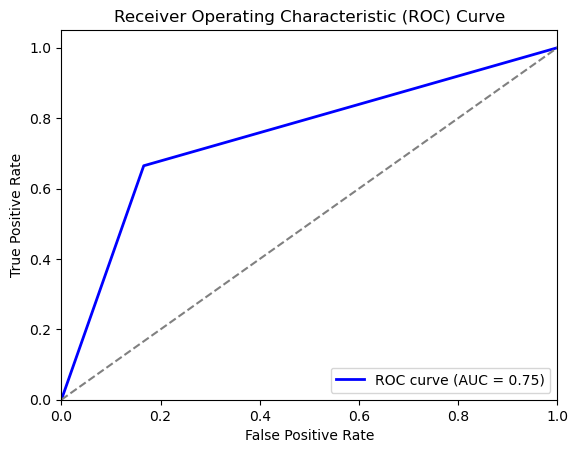

AUC Score: 0.75


In [126]:
fpr, tpr, _ = roc_curve(y_test, y_pred6)
roc_auc = auc(fpr, tpr)

plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='grey', linestyle='--')  # Random classifier line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Print AUC score
print(f"AUC Score: {roc_auc:.2f}")

### * **Random Forest**

In [128]:
# Import Random Forest Classifier Model
from sklearn.ensemble import RandomForestClassifier

# Initialize and train Random Forest model
rfc = RandomForestClassifier()
rfc.fit(x_train_smote,y_train_smote)

RandomForestClassifier()

In [129]:
# Predict on test data
y_pred7 = rfc.predict(x_test)
y_pred7  # Display test predictions

array([0, 0, 0, ..., 0, 0, 0])

In [130]:
# Predict on training data
y_train_pred7 = rfc.predict(x_train)
y_train_pred7  # Display training predictions

array([0, 0, 0, ..., 1, 0, 1])

In [131]:
# Compute confusion matrix
confusion_matrix(y_test,y_pred7)

array([[935,  53],
       [ 47, 120]], dtype=int64)

In [132]:
# Print classification report for test data
print(classification_report(y_test,y_pred7))

              precision    recall  f1-score   support

           0       0.95      0.95      0.95       988
           1       0.69      0.72      0.71       167

    accuracy                           0.91      1155
   macro avg       0.82      0.83      0.83      1155
weighted avg       0.91      0.91      0.91      1155



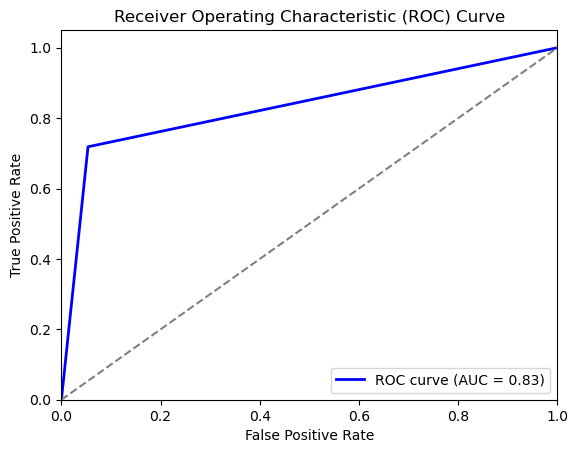

AUC Score: 0.83


In [133]:
fpr, tpr, _ = roc_curve(y_test, y_pred7)
roc_auc = auc(fpr, tpr)

plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='grey', linestyle='--')  # Random classifier line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Print AUC score
print(f"AUC Score: {roc_auc:.2f}")

### * **Gradient Boosting**

In [135]:
# Import Gradient Boosting Classifier Model
from sklearn.ensemble import GradientBoostingClassifier

# Initialize and train Gradient Boosting model
gbc = GradientBoostingClassifier()
gbc.fit(x_train_smote,y_train_smote)

GradientBoostingClassifier()

In [137]:
# Predict on test data
y_pred8 = gbc.predict(x_test)
y_pred8  # Display test predictions

array([0, 0, 0, ..., 0, 0, 0])

In [139]:
# Predict on training data
y_train_pred8 = gbc.predict(x_train)
y_train_pred8  # Display training predictions

array([0, 0, 0, ..., 1, 0, 1])

In [140]:
# Compute confusion matrix
confusion_matrix(y_test,y_pred8)

array([[901,  87],
       [ 40, 127]], dtype=int64)

In [141]:
# Print classification report for test data
print(classification_report(y_test,y_pred8))

              precision    recall  f1-score   support

           0       0.96      0.91      0.93       988
           1       0.59      0.76      0.67       167

    accuracy                           0.89      1155
   macro avg       0.78      0.84      0.80      1155
weighted avg       0.90      0.89      0.90      1155



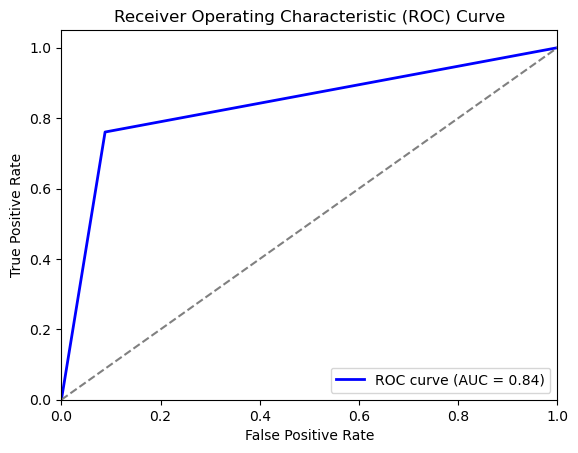

AUC Score: 0.84


In [142]:
fpr, tpr, _ = roc_curve(y_test, y_pred8)
roc_auc = auc(fpr, tpr)

plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='grey', linestyle='--')  # Random classifier line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Print AUC score
print(f"AUC Score: {roc_auc:.2f}")

### * **eXtreme Gradient Boosting**

In [144]:
# Import XGBoost Classifier Model
from xgboost import XGBClassifier

# Initialize and train XGBoost model
xgbc = XGBClassifier()
xgbc.fit(x_train_smote,y_train_smote)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [147]:
# Predict on test data and adjust labels back
y_pred9 = xgbc.predict(x_test)
y_pred9  # Display test predictions

array([0, 0, 0, ..., 0, 0, 0])

In [148]:
# Predict on training data and adjust labels back
y_train_pred9 = xgbc.predict(x_train)
y_train_pred9  # Display training predictions

array([0, 0, 0, ..., 1, 0, 1])

In [149]:
# Compute confusion matrix
confusion_matrix(y_test,y_pred9)

array([[939,  49],
       [ 47, 120]], dtype=int64)

In [150]:
# Print classification report for test data
print(classification_report(y_test,y_pred9))

              precision    recall  f1-score   support

           0       0.95      0.95      0.95       988
           1       0.71      0.72      0.71       167

    accuracy                           0.92      1155
   macro avg       0.83      0.83      0.83      1155
weighted avg       0.92      0.92      0.92      1155



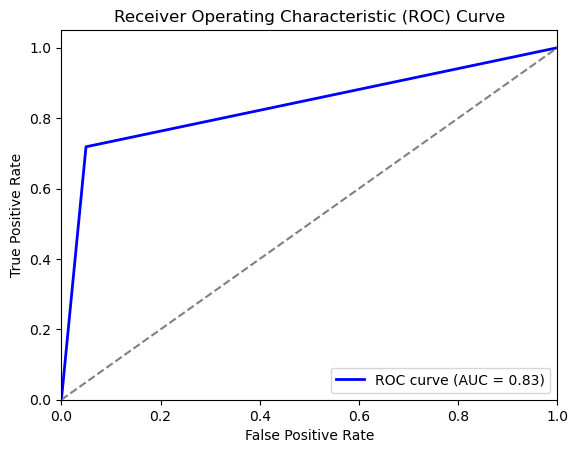

AUC Score: 0.83


In [151]:
fpr, tpr, _ = roc_curve(y_test, y_pred9)
roc_auc = auc(fpr, tpr)

plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='grey', linestyle='--')  # Random classifier line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Print AUC score
print(f"AUC Score: {roc_auc:.2f}")

### * **LightGBM**

In [152]:
# Install LightGBM if not installed
!pip install lightgbm

In [153]:
# Import LightGBM Classifier Model
from lightgbm import LGBMClassifier

# Initialize and train LightGBM Classifier model
lgbmc = LGBMClassifier()
lgbmc.fit(x_train_smote,y_train_smote)

[LightGBM] [Info] Number of positive: 2973, number of negative: 2973
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002274 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2074
[LightGBM] [Info] Number of data points in the train set: 5946, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


LGBMClassifier()

In [154]:
# Predict on test data and adjust labels back
y_pred10 = lgbmc.predict(x_test)
y_pred10  # Display test predictions

array([0, 0, 0, ..., 0, 0, 0])

In [155]:
# Predict on training data and adjust labels back
y_train_pred10 = lgbmc.predict(x_train)
y_train_pred10  # Display training predictions

array([0, 0, 0, ..., 1, 0, 1])

In [156]:
# Compute confusion matrix
confusion_matrix(y_test,y_pred10)

array([[937,  51],
       [ 45, 122]], dtype=int64)

In [157]:
# Print classification report for test data
print(classification_report(y_test,y_pred10))

              precision    recall  f1-score   support

           0       0.95      0.95      0.95       988
           1       0.71      0.73      0.72       167

    accuracy                           0.92      1155
   macro avg       0.83      0.84      0.83      1155
weighted avg       0.92      0.92      0.92      1155



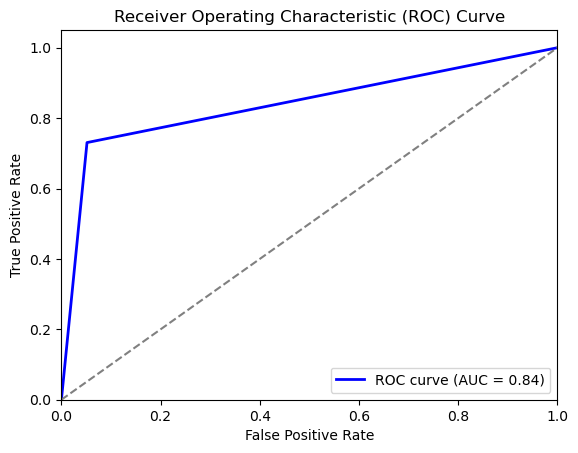

AUC Score: 0.84


In [158]:
fpr, tpr, _ = roc_curve(y_test, y_pred10)
roc_auc = auc(fpr, tpr)

plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='grey', linestyle='--')  # Random classifier line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Print AUC score
print(f"AUC Score: {roc_auc:.2f}")

---
# **Model Eveluation:**
---

In [161]:
# List of test set predictions from different models
all_model_pred = [y_pred1,y_pred2,y_pred3,y_pred4,y_pred5,y_pred6,y_pred7,y_pred8,y_pred9,y_pred10]
# Lists to store evaluation metrics for test set
all_model_accuracy_score = []
all_model_recall_score = []
all_model_precision_score = []
all_model_f1_score = []

# List of train set predictions from different models
all_model_train_pred = [y_train_pred1,y_train_pred2,y_train_pred3,y_train_pred4,y_train_pred5,y_train_pred6,y_train_pred7,y_train_pred8,y_train_pred9,y_train_pred10]
# Lists to store evaluation metrics for train set
all_model_train_accuracy_score = []
all_model_train_recall_score = []
all_model_train_precision_score = []
all_model_train_f1_score = []

# Loop through each model's predictions and compute performance metrics
for i,j in zip(all_model_pred,all_model_train_pred):
    # Compute test set metrics
    all_model_accuracy_score.append(accuracy_score(y_test,i) * 100)
    all_model_recall_score.append(recall_score(y_test,i) * 100)
    all_model_precision_score.append(precision_score(y_test,i) * 100)
    all_model_f1_score.append(f1_score(y_test,i) * 100)

    # Compute train set metrics
    all_model_train_accuracy_score.append(accuracy_score(y_train,j) * 100)
    all_model_train_recall_score.append(recall_score(y_train,j) * 100)
    all_model_train_precision_score.append(precision_score(y_train,j) * 100)
    all_model_train_f1_score.append(f1_score(y_train,j) * 100)

# Define model names corresponding to the stored predictions
model_name = ['Logistic Regression',
              'Support Vector Machine',
              'K-Nearest Neighbor',
              'Decision Tree',
              'Bagging',
              'AdaBoost',
              'Random Forest',
              'Gradient Boosting',
              'Extreme Gradient Boosting',
              'LightGBM']

# Create a DataFrame for test set evaluation metrics
dt_test = {'accuracy_score_test':all_model_accuracy_score,
           'recall_score_test':all_model_recall_score,
           'precision_score_test':all_model_precision_score,
           'f1_score_test':all_model_f1_score}
df_model_ev_test = pd.DataFrame(dt_test, index=model_name)

# Create a DataFrame for train set evaluation metrics
dt_train = {'accuracy_score_train':all_model_train_accuracy_score,
            'recall_score_train':all_model_train_recall_score,
            'precision_score_train':all_model_train_precision_score,
            'f1_score_train':all_model_train_f1_score}
df_model_ev_train = pd.DataFrame(dt_train, index=model_name)

In [162]:
# Displaying the evaluation metrics DataFrame for the test set
# This will show accuracy, recall, precision, and F1 score for each model
df_model_ev_test

,accuracy_score_test,recall_score_test,precision_score_test,f1_score_test
Logistic Regression,76.103896,77.245509,35.149864,48.314607
Support Vector Machine,68.831169,28.742515,16.608997,21.052632
K-Nearest Neighbor,75.238095,65.269461,32.344214,43.253968
Decision Tree,83.809524,72.455090,46.183206,56.410256
Bagging,89.956710,71.257485,63.636364,67.231638
AdaBoost,80.952381,66.467066,40.363636,50.226244
Random Forest,91.341991,71.856287,69.364162,70.588235
Gradient Boosting,89.004329,76.047904,59.345794,66.666667
Extreme Gradient Boosting,91.688312,71.856287,71.005917,71.428571
LightGBM,91.688312,73.053892,70.520231,71.764706


In [163]:
# Displaying the evaluation metrics DataFrame for the training set
# This will show accuracy, recall, precision, and F1 score for each model
df_model_ev_train

,accuracy_score_train,recall_score_train,precision_score_train,f1_score_train
Logistic Regression,73.772386,75.255624,31.861472,44.768856
Support Vector Machine,68.024263,25.562372,14.400922,18.422992
K-Nearest Neighbor,84.084344,96.319018,46.912351,63.094441
Decision Tree,100.000000,100.000000,100.000000,100.000000
Bagging,99.855575,99.591002,99.387755,99.489275
AdaBoost,81.917966,74.028630,42.044135,53.629630
Random Forest,100.000000,100.000000,100.000000,100.000000
Gradient Boosting,91.334489,86.094070,64.471669,73.730298
Extreme Gradient Boosting,99.942230,99.591002,100.000000,99.795082
LightGBM,98.786828,95.705521,95.705521,95.705521


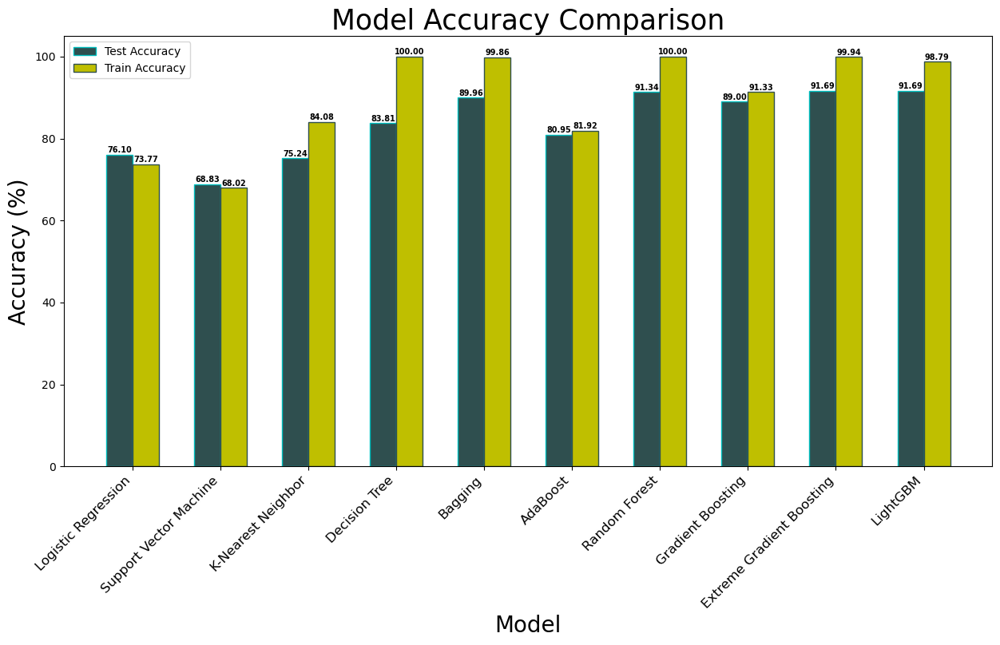

In [164]:
plt.figure(figsize=(15, 7))

# multipule bar graphe
# xticks function = To give name a stick and bring that name between 2 sticks
p_x = model_name
P_y = df_model_ev_test['accuracy_score_test']
P_z = df_model_ev_train['accuracy_score_train']

width = 0.3
p = np.arange(len(p_x))
p1 = [j + width for j in p ]

plt.bar(p,P_y,width,color = "darkslategrey",label = "Test Accuracy",edgecolor = 'c')
plt.bar(p1,P_z,width,color = "y",label = "Train Accuracy",edgecolor = 'darkslategrey')

# Add values on top of the bars
for i in range(len(p)):
    plt.text(p[i], P_y[i] + 0.5, f'{P_y[i]:.2f}', ha='center', fontsize=7, fontweight='bold')
    plt.text(p1[i], P_z[i] + 0.5, f'{P_z[i]:.2f}', ha='center', fontsize=7, fontweight='bold')

plt.xticks()       # xticks function = To give name a stick and bring that name between 2 sticks
plt.xticks(p+width/2,p_x,rotation=45, ha="right", fontsize=12)
plt.xlabel("Model", fontsize=20)
plt.ylabel("Accuracy (%)", fontsize=20)
plt.title("Model Accuracy Comparison", fontsize=25)
plt.legend()
plt.show()

---
# **Hyper Parameter Tuning:**
---

In [166]:
# Import RandomizedSearchCV from scikit-learn to perform randomized hyperparameter search
from sklearn.model_selection import GridSearchCV

### * **Hyper Parameter Tuning of Logistic Regression**

In [168]:
# Initialize the Logistic Regression model
model_1 = LogisticRegression(max_iter=100)

# Define the parameter distribution for GridSearchCV
param_dist_1 = {
    'C': (1,10,100,1000),  # Regularization parameter
    'solver': ['lbfgs', 'liblinear', 'saga'],  # Solvers to choose from
    'random_state': np.arange(1, 151)  # random_state from 1 to 150
}

# Setup GridSearchCV to search for best hyperparameters
grid_search_lr = GridSearchCV(
    estimator=model_1,   # The model to tune
    param_grid=param_dist_1,   # The parameter distribution to sample from
    cv=5,                # specifies 5-fold cross-validation for evaluating each combination of hyperparameters
    scoring='accuracy',  # Use accuracy as the scoring metric
    n_jobs=-1,           # Use all processors for parallelism
    verbose=2,           # Display detailed logs during the process
    refit=True           # Refit the best model on the entire training set
)

# Perform hyperparameter search using GridSearchCV for Logistic Regression
grid_search_lr.fit(x_train_smote, y_train_smote)

# Retrieve the best hyperparameters and best accuracy score found during search
best_params1 = grid_search_lr.best_params_   # Best combination of hyperparameters
best_score1 = grid_search_lr.best_score_     # Best cross-validation accuracy score

# Print the best parameters and best accuracy score obtained during training
print(f"Best Parameters: {best_params1}")
print(f"Best Score: {best_score1}")

# Evaluate the best model found on the test and training set
y_test_h_pred1 = grid_search_lr.predict(x_test)     # Predict on test set
y_train_h_pred1 = grid_search_lr.predict(x_train)   # Predict on training set

# Calculate accuracy for both training and test datasets
test_accuracy1 = accuracy_score(y_test, y_test_h_pred1)     # Accuracy on test data
train_accuracy1 = accuracy_score(y_train,y_train_h_pred1)   # Accuracy on train data

# Compute the F1-score using the weighted average approach (suitable for imbalanced classes)
f1score1=f1_score(y_test, y_test_h_pred1)

# Print the evaluation metrics
print(f"Train Set Accuracy: {train_accuracy1}")  # Accuracy on training set
print(f"Test Set Accuracy: {test_accuracy1}")    # Accuracy on test set
print(f"f1 score: {f1score1}")                   # Weighted F1-score (balances precision & recall)

Fitting 5 folds for each of 1800 candidates, totalling 9000 fits
Best Parameters: {'C': 10, 'random_state': 1, 'solver': 'liblinear'}
Best Score: 0.7581577626845525
Train Set Accuracy: 0.7391681109185442
Test Set Accuracy: 0.7627705627705628
f1 score: 0.4830188679245283


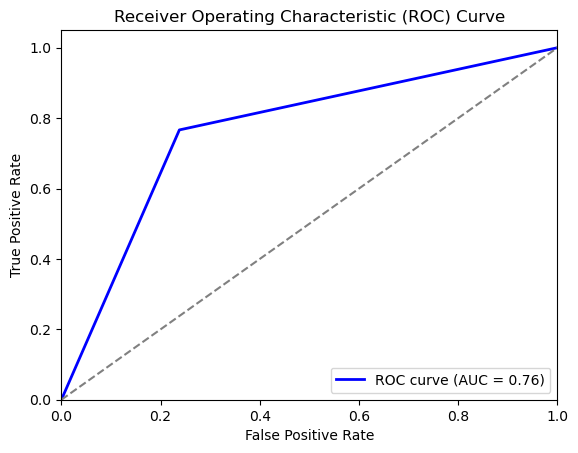

AUC Score: 0.76


In [169]:
fpr, tpr, _ = roc_curve(y_test, y_test_h_pred1)
roc_auc = auc(fpr, tpr)

plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='grey', linestyle='--')  # Random classifier line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Print AUC score
print(f"AUC Score: {roc_auc:.2f}")

### * **Hyper Parameter Tuning of Support Vector Machine**

In [171]:
# Initialize the Support Vector Machine classifier model
model_2 = SVC(max_iter=1000)

# Define the parameter distribution for GridSearchCV
param_dist_2 = {
    'C': [0.1, 1, 10, 100],  # Regularization parameter, controlling the trade-off between bias and variance
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],  # Types of kernel functions to use in SVM (linear, polynomial, radial basis function, and sigmoid)
    'gamma': ['scale', 'auto']} # Kernel coefficient options (scale is default and 'auto' uses 1/n_features)

# Setup GridSearchCV to search for best hyperparameters
grid_search_svc = GridSearchCV(
    estimator=model_2,   # The model to tune
    param_grid=param_dist_2,   # The parameter distribution to sample from
    cv=5,                # specifies 5-fold cross-validation for evaluating each combination of hyperparameters
    scoring='accuracy',  # Use accuracy as the scoring metric
    n_jobs=-1,           # Use all processors for parallelism
    verbose=2,           # Display detailed logs during the process
    refit=True           # Refit the best model on the entire training set
)

# Perform hyperparameter search using GridSearchCV for Support Vector Machine classifier
grid_search_svc.fit(x_train_smote, y_train_smote)

# Retrieve the best hyperparameters and best accuracy score found during search
best_params2 = grid_search_svc.best_params_   # Best combination of hyperparameters
best_score2 = grid_search_svc.best_score_     # Best cross-validation accuracy score

# Print the best parameters and best accuracy score obtained during training
print(f"Best Parameters: {best_params2}")
print(f"Best Score: {best_score2}")

# Evaluate the best model found on the test and training set
y_test_h_pred2 = grid_search_svc.predict(x_test)     # Predict on test set
y_train_h_pred2 = grid_search_svc.predict(x_train)   # Predict on training set

# Calculate accuracy for both training and test datasets
test_accuracy2 = accuracy_score(y_test, y_test_h_pred2)     # Accuracy on test data
train_accuracy2 = accuracy_score(y_train,y_train_h_pred2)   # Accuracy on train data

# Compute the F1-score using the weighted average approach (suitable for imbalanced classes)
f1score2=f1_score(y_test, y_test_h_pred2)

# Print the evaluation metrics
print(f"Train Set Accuracy: {train_accuracy2}")  # Accuracy on training set
print(f"Test Set Accuracy: {test_accuracy2}")    # Accuracy on test set
print(f"f1 score: {f1score2}")                   # Weighted F1-score (balances precision & recall)

Fitting 5 folds for each of 32 candidates, totalling 160 fits
Best Parameters: {'C': 10, 'gamma': 'auto', 'kernel': 'rbf'}
Best Score: 0.7976777321525751
Train Set Accuracy: 0.7645869439630272
Test Set Accuracy: 0.7454545454545455
f1 score: 0.4389312977099237


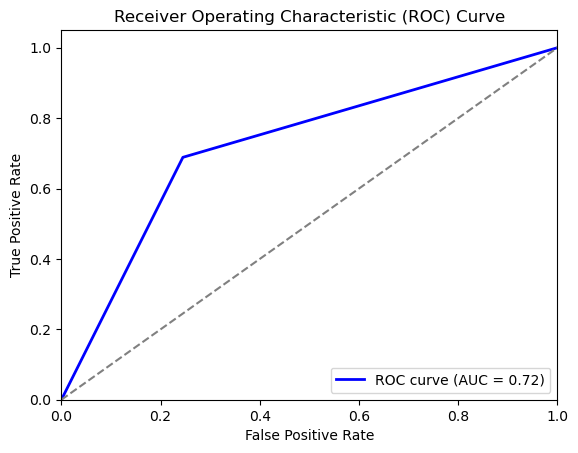

AUC Score: 0.72


In [173]:
fpr, tpr, _ = roc_curve(y_test, y_test_h_pred2)
roc_auc = auc(fpr, tpr)

plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='grey', linestyle='--')  # Random classifier line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Print AUC score
print(f"AUC Score: {roc_auc:.2f}")

### * **Hyper Parameter Tuning of K-Nearest Neighbor**

In [177]:
# Initialize the K-Nearest Neighbor classifier model
model_3 = KNeighborsClassifier()

# Define the parameter distribution for GridSearchCV
param_dist_3 = {
    'n_neighbors': range(1, 11),  # Number of neighbors to use in KNN (range from 1 to 20)
    'weights': ['uniform', 'distance'],  # Weight function to use: 'uniform' assigns equal weight, 'distance' gives closer neighbors more weight
    'metric': ['euclidean', 'manhattan', 'minkowski'],  # Distance metrics to use: Euclidean, Manhattan, or Minkowski
    'p': [1, 2]   # Power parameter for Minkowski distance: p=1 for Manhattan, p=2 for Euclidean
}

# Setup GridSearchCV to search for best hyperparameters
grid_search_knnc = GridSearchCV(
    estimator=model_3,   # The model to tune
    param_grid=param_dist_3,   # The parameter distribution to sample from
    cv=5,                # specifies 5-fold cross-validation for evaluating each combination of hyperparameters
    scoring='accuracy',  # Use accuracy as the scoring metric
    n_jobs=-1,           # Use all processors for parallelism
    verbose=2,           # Display detailed logs during the process
    refit=True           # Refit the best model on the entire training set
)

# Perform hyperparameter search using GridSearchCV for K-Nearest Neighbor classifier
grid_search_knnc.fit(x_train_smote, y_train_smote)

# Retrieve the best hyperparameters and best accuracy score found during search
best_params3 = grid_search_knnc.best_params_   # Best combination of hyperparameters
best_score3 = grid_search_knnc.best_score_     # Best cross-validation accuracy score

# Print the best parameters and best accuracy score obtained during training
print(f"Best Parameters: {best_params3}")
print(f"Best Score: {best_score3}")

# Evaluate the best model found on the test and training set
y_test_h_pred3 = grid_search_knnc.predict(x_test)     # Predict on test set
y_train_h_pred3 = grid_search_knnc.predict(x_train)   # Predict on training set

# Calculate accuracy for both training and test datasets
test_accuracy3 = accuracy_score(y_test, y_test_h_pred3)     # Accuracy on test data
train_accuracy3 = accuracy_score(y_train,y_train_h_pred3)   # Accuracy on train data

# Compute the F1-score using the weighted average approach (suitable for imbalanced classes)
f1score3=f1_score(y_test, y_test_h_pred3)

# Print the evaluation metrics
print(f"Train Set Accuracy: {train_accuracy3}")  # Accuracy on training set
print(f"Test Set Accuracy: {test_accuracy3}")    # Accuracy on test set
print(f"f1 score: {f1score3}")                   # Weighted F1-score (balances precision & recall)

Fitting 5 folds for each of 120 candidates, totalling 600 fits
Best Parameters: {'metric': 'manhattan', 'n_neighbors': 2, 'p': 1, 'weights': 'uniform'}
Best Score: 0.9039697224558452
Train Set Accuracy: 0.9965337954939342
Test Set Accuracy: 0.8303030303030303
f1 score: 0.44


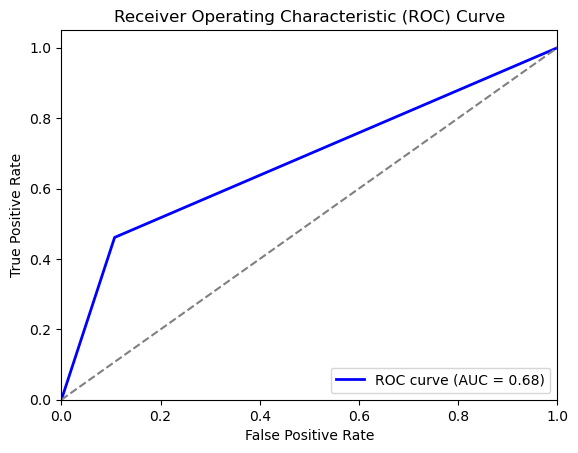

AUC Score: 0.68


In [178]:
fpr, tpr, _ = roc_curve(y_test, y_test_h_pred3)
roc_auc = auc(fpr, tpr)

plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='grey', linestyle='--')  # Random classifier line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Print AUC score
print(f"AUC Score: {roc_auc:.2f}")

### * **Hyper Parameter Tuning of Decision Tree**

In [180]:
# Initialize the Decision Tree classifier model
model_4 = DecisionTreeClassifier()

# Define the parameter distribution for GridSearchCV
param_dist_4 = {
    "criterion":("gini", "entropy"),      #quality of split
    "splitter":("best", "random"),        # searches the features for a split
    "max_depth":(list(range(1, 17))),     #depth of tree range from 1 to 14
    "min_samples_split":[2, 3, 4],   #the minimum number of samples required to split internal node
    "min_samples_leaf":list(range(1, 10)) #minimum number of samples required to be at a leaf node,we are passing list which is range from 1 to 14
    }

# Setup GridSearchCV to search for best hyperparameters
grid_search_dtc = GridSearchCV(
    estimator=model_4,   # The model to tune
    param_grid=param_dist_4,   # The parameter distribution to sample from
    cv=5,                # specifies 5-fold cross-validation for evaluating each combination of hyperparameters
    scoring='accuracy',  # Use accuracy as the scoring metric
    n_jobs=-1,           # Use all processors for parallelism
    verbose=2,           # Display detailed logs during the process
    refit=True           # Refit the best model on the entire training set
)

# Perform hyperparameter search using GridSearchCV for Decision Tree classifier
grid_search_dtc.fit(x_train_smote, y_train_smote)

# Retrieve the best hyperparameters and best accuracy score found during search
best_params4 = grid_search_dtc.best_params_   # Best combination of hyperparameters
best_score4 = grid_search_dtc.best_score_     # Best cross-validation accuracy score

# Print the best parameters and best accuracy score obtained during training
print(f"Best Parameters: {best_params4}")
print(f"Best Score: {best_score4}")

# Evaluate the best model found on the test and training set
y_test_h_pred4 = grid_search_dtc.predict(x_test)     # Predict on test set
y_train_h_pred4 = grid_search_dtc.predict(x_train)   # Predict on training set

# Calculate accuracy for both training and test datasets
test_accuracy4 = accuracy_score(y_test, y_test_h_pred4)     # Accuracy on test data
train_accuracy4 = accuracy_score(y_train,y_train_h_pred4)   # Accuracy on train data

# Compute the F1-score using the weighted average approach (suitable for imbalanced classes)
f1score4=f1_score(y_test, y_test_h_pred4)

# Print the evaluation metrics
print(f"Train Set Accuracy: {train_accuracy4}")  # Accuracy on training set
print(f"Test Set Accuracy: {test_accuracy4}")    # Accuracy on test set
print(f"f1 score: {f1score4}")                   # Weighted F1-score (balances precision & recall)

Fitting 5 folds for each of 1728 candidates, totalling 8640 fits
Best Parameters: {'criterion': 'entropy', 'max_depth': 14, 'min_samples_leaf': 1, 'min_samples_split': 3, 'splitter': 'best'}
Best Score: 0.862258376857892
Train Set Accuracy: 0.9566724436741768
Test Set Accuracy: 0.8389610389610389
f1 score: 0.5654205607476636


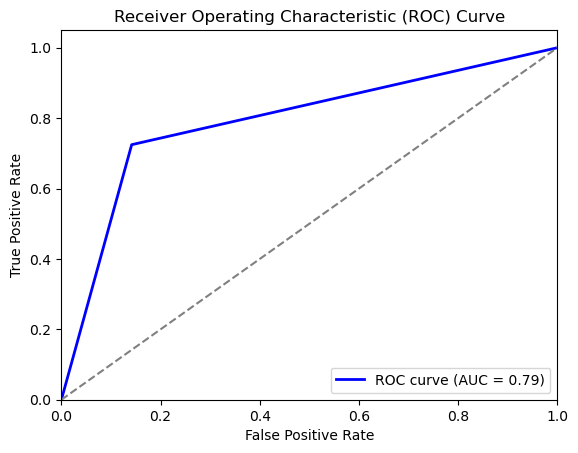

AUC Score: 0.79


In [181]:
fpr, tpr, _ = roc_curve(y_test, y_test_h_pred4)
roc_auc = auc(fpr, tpr)

plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='grey', linestyle='--')  # Random classifier line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Print AUC score
print(f"AUC Score: {roc_auc:.2f}")

### * **Hyper Parameter Tuning of Bagging**

In [183]:
# Define base estimator (DecisionTree in this case)
base_knn1 = KNeighborsClassifier()
    
# Initialize the Bagging classifier model
model_5 = BaggingClassifier(estimator=base_knn1, random_state=42)

# Define the parameter distribution for GridSearchCV
param_dist_5 = {
    'n_estimators': [10, 50, 100, 200],  # Number of estimators
    'max_samples': [0.5, 0.7, 1.0],  # Percentage of training data used
    'max_features': [0.5, 0.7, 1.0],  # Fraction of features per estimator
    'bootstrap': [True, False],       # Sampling method
    'oob_score': [True, False]        # Use out-of-bag validation
}

# Setup GridSearchCV to search for best hyperparameters
grid_search_bc = GridSearchCV(
    estimator=model_5,   # The model to tune
    param_grid=param_dist_5,   # The parameter distribution to sample from
    cv=5,                # specifies 5-fold cross-validation for evaluating each combination of hyperparameters
    scoring='accuracy',  # Use accuracy as the scoring metric
    n_jobs=-1,           # Use all processors for parallelism
    verbose=2,           # Display detailed logs during the process
    refit=True           # Refit the best model on the entire training set
)

# Perform hyperparameter search using GridSearchCV for Bagging classifier 
grid_search_bc.fit(x_train_smote, y_train_smote)

# Retrieve the best hyperparameters and best accuracy score found during search
best_params5 = grid_search_bc.best_params_   # Best combination of hyperparameters
best_score5 = grid_search_bc.best_score_     # Best cross-validation accuracy score

# Print the best parameters and best accuracy score obtained during training
print(f"Best Parameters: {best_params5}")
print(f"Best Score: {best_score5}")

# Evaluate the best model found on the test and training set
y_test_h_pred5 = grid_search_bc.predict(x_test)     # Predict on test set
y_train_h_pred5 = grid_search_bc.predict(x_train)   # Predict on training set

# Calculate accuracy for both training and test datasets
test_accuracy5 = accuracy_score(y_test, y_test_h_pred5)     # Accuracy on test data
train_accuracy5 = accuracy_score(y_train,y_train_h_pred5)   # Accuracy on train data

# Compute the F1-score using the weighted average approach (suitable for imbalanced classes)
f1score5=f1_score(y_test, y_test_h_pred5)

# Print the evaluation metrics
print(f"Train Set Accuracy: {train_accuracy5}")  # Accuracy on training set
print(f"Test Set Accuracy: {test_accuracy5}")    # Accuracy on test set
print(f"f1 score: {f1score5}")                   # Weighted F1-score (balances precision & recall)

Fitting 5 folds for each of 144 candidates, totalling 720 fits
Best Parameters: {'bootstrap': False, 'max_features': 0.5, 'max_samples': 1.0, 'n_estimators': 200, 'oob_score': False}
Best Score: 0.926842979412118
Train Set Accuracy: 0.9855574812247256
Test Set Accuracy: 0.8744588744588745
f1 score: 0.6049046321525886


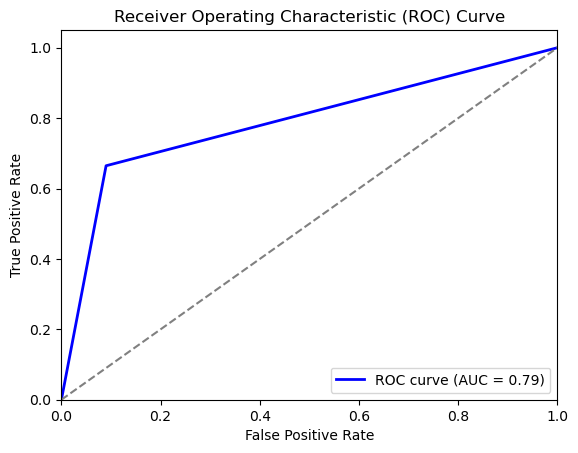

AUC Score: 0.79


In [184]:
fpr, tpr, _ = roc_curve(y_test, y_test_h_pred5)
roc_auc = auc(fpr, tpr)

plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='grey', linestyle='--')  # Random classifier line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Print AUC score
print(f"AUC Score: {roc_auc:.2f}")

### * **Hyper Parameter Tuning of AdaBoost**

In [186]:
# Define base estimator (DecisionTree in this case)
base_dtc2 = DecisionTreeClassifier()
    
# Initialize the AdaBoost classifier model
model_6 = AdaBoostClassifier(estimator=base_dtc2, random_state= 42)

# Define the parameter distribution for GridSearchCV
param_dist_6 = {
 'n_estimators' : [300, 500, 600],      # Number of weak learners
 'learning_rate' : [0.001,0.01,0.05,0.1,0.3,0.4],  # Step size for updating weights
 'estimator__max_depth' : [3, 5, 6, 7]
}

# Setup GridSearchCV to search for best hyperparameters
grid_search_dtc = GridSearchCV(
    estimator=model_6,   # The model to tune
    param_grid=param_dist_6,   # The parameter distribution to sample from
    cv=5,                # specifies 5-fold cross-validation for evaluating each combination of hyperparameters
    scoring='accuracy',  # Use accuracy as the scoring metric
    n_jobs=-1,           # Use all processors for parallelism
    verbose=2,           # Display detailed logs during the process
    refit=True           # Refit the best model on the entire training set
)

# Perform hyperparameter search using GridSearchCV for AdaBoost classifier
grid_search_abc.fit(x_train_smote, y_train_smote)

# Retrieve the best hyperparameters and best accuracy score found during search
best_params6 = grid_search_abc.best_params_   # Best combination of hyperparameters
best_score6 = grid_search_abc.best_score_     # Best cross-validation accuracy score

# Print the best parameters and best accuracy score obtained during training
print(f"Best Parameters: {best_params6}")
print(f"Best Score: {best_score6}")

# Evaluate the best model found on the test and training set
y_test_h_pred6 = grid_search_abc.predict(x_test)     # Predict on test set
y_train_h_pred6 = grid_search_abc.predict(x_train)   # Predict on training set

# Calculate accuracy for both training and test datasets
test_accuracy6 = accuracy_score(y_test, y_test_h_pred6)     # Accuracy on test data
train_accuracy6 = accuracy_score(y_train,y_train_h_pred6)   # Accuracy on train data

# Compute the F1-score using the weighted average approach (suitable for imbalanced classes)
f1score6=f1_score(y_test, y_test_h_pred6)

# Print the evaluation metrics
print(f"Train Set Accuracy: {train_accuracy6}")  # Accuracy on training set
print(f"Test Set Accuracy: {test_accuracy6}")    # Accuracy on test set
print(f"f1 score: {f1score6}")                   # Weighted F1-score (balances precision & recall)

Fitting 5 folds for each of 72 candidates, totalling 360 fits
Best Parameters: {'estimator__max_depth': 5, 'learning_rate': 0.4, 'n_estimators': 600}
Best Score: 0.9510621877009846
Train Set Accuracy: 1.0
Test Set Accuracy: 0.9203463203463204
f1 score: 0.6870748299319728


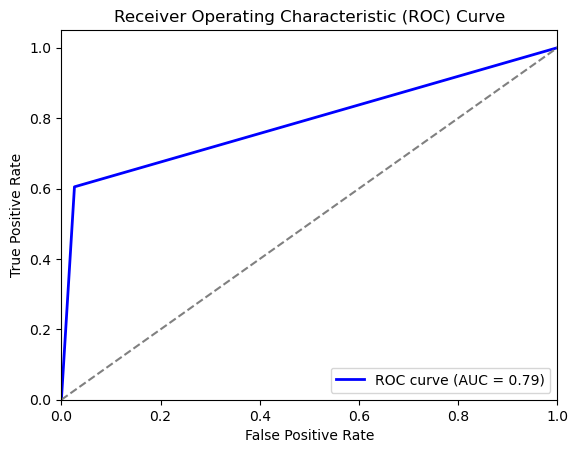

AUC Score: 0.79


In [189]:
fpr, tpr, _ = roc_curve(y_test, y_test_h_pred6)
roc_auc = auc(fpr, tpr)

plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='grey', linestyle='--')  # Random classifier line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Print AUC score
print(f"AUC Score: {roc_auc:.2f}")

### * **Hyper Parameter Tuning of Random Forest**

In [191]:
# Initialize the Random Forest classifier model
model_7 = RandomForestClassifier()

# Define the parameter distribution for GridSearchCV
n_estimators = [int(x) for x in np.linspace(start=200, stop=2000, num=5)]      # List Comprehension-using for loop in list
max_features = ['auto', 'sqrt','log2']        # maximum number of features allowed to try in individual tree
max_depth = [int(x) for x in np.linspace(10, 110, num=5)]            # List Comprehension-using for loop in list
max_depth.append(None)
min_samples_split = [2, 5]          # minimum number of samples required to split an internal node
min_samples_leaf = [1, 2]              # minimum number of samples required to be at a leaf node.


param_dist_7 = {'n_estimators': n_estimators, 'max_features': max_features,'max_depth': max_depth, 'min_samples_split': min_samples_split,
                'min_samples_leaf': min_samples_leaf}

# Setup GridSearchCV to search for best hyperparameters
grid_search_rfc = GridSearchCV(
    estimator=model_7,   # The model to tune
    param_grid=param_dist_7,   # The parameter distribution to sample from
    cv=5,                # specifies 5-fold cross-validation for evaluating each combination of hyperparameters
    scoring='accuracy',  # Use accuracy as the scoring metric
    n_jobs=-1,           # Use all processors for parallelism
    verbose=2,           # Display detailed logs during the process
    refit=True           # Refit the best model on the entire training set
)

# Perform hyperparameter search using GridSearchCV for Random Forest classifier 
grid_search_rfc.fit(x_train_smote, y_train_smote)

# Retrieve the best hyperparameters and best accuracy score found during search
best_params7 = grid_search_rfc.best_params_   # Best combination of hyperparameters
best_score7 = grid_search_rfc.best_score_     # Best cross-validation accuracy score

# Print the best parameters and best accuracy score obtained during training
print(f"Best Parameters: {best_params7}")
print(f"Best Score: {best_score7}")

# Evaluate the best model found on the test and training set
y_test_h_pred7 = grid_search_rfc.predict(x_test)     # Predict on test set
y_train_h_pred7 = grid_search_rfc.predict(x_train)   # Predict on training set

# Calculate accuracy for both training and test datasets
test_accuracy7 = accuracy_score(y_test, y_test_h_pred7)     # Accuracy on test data
train_accuracy7 = accuracy_score(y_train,y_train_h_pred7)   # Accuracy on train data

# Compute the F1-score using the weighted average approach (suitable for imbalanced classes)
f1score7=f1_score(y_test, y_test_h_pred7)

# Print the evaluation metrics
print(f"Train Set Accuracy: {train_accuracy7}")  # Accuracy on training set
print(f"Test Set Accuracy: {test_accuracy7}")    # Accuracy on test set
print(f"f1 score: {f1score7}")                  # Weighted F1-score (balances precision & recall)

Fitting 5 folds for each of 360 candidates, totalling 1800 fits
Best Parameters: {'max_depth': 35, 'max_features': 'log2', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 2000}
Best Score: 0.9236454615487911
Train Set Accuracy: 1.0
Test Set Accuracy: 0.9082251082251083
f1 score: 0.6936416184971098


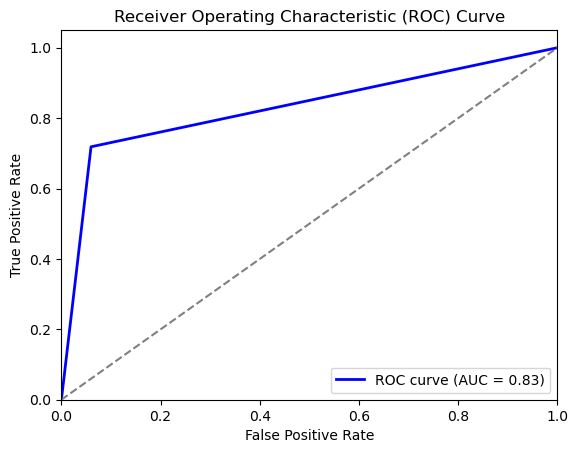

AUC Score: 0.83


In [192]:
fpr, tpr, _ = roc_curve(y_test, y_test_h_pred7)
roc_auc = auc(fpr, tpr)

plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='grey', linestyle='--')  # Random classifier line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Print AUC score
print(f"AUC Score: {roc_auc:.2f}")

### * **Hyper Parameter Tuning of Gradient Boosting**

In [194]:
# Initialize the Gradient Boosting Classifier model
model_8 = GradientBoostingClassifier()

# Define the parameter distribution for GridSearchCV
param_dist_8 = {
    'learning_rate': [0.5, 0.6, 0.7, 0.8, 0.9],  # Controls how much each tree contributes to the final prediction
    'max_depth': [6, 7, 8],          # Maximum depth of each individual decision tree (controls model complexity)
    'n_estimators': [500, 600, 700]  # Number of trees (higher values may improve accuracy but increase training time)
}

# Setup GridSearchCV to search for best hyperparameters
grid_search_gbc = GridSearchCV(
    estimator=model_8,   # The model to tune
    param_grid=param_dist_8,   # The parameter distribution to sample from
    cv=5,                # specifies 5-fold cross-validation for evaluating each combination of hyperparameters
    scoring='accuracy',  # Use accuracy as the scoring metric
    n_jobs=-1,           # Use all processors for parallelism
    verbose=2,           # Display detailed logs during the process
    refit=True           # Refit the best model on the entire training set
)

# Perform hyperparameter search using GridSearchCV for Gradient Boosting Classifier
grid_search_gbc.fit(x_train_smote, y_train_smote)

# Retrieve the best hyperparameters and best accuracy score found during search
best_params8 = grid_search_gbc.best_params_   # Best combination of hyperparameters
best_score8 = grid_search_gbc.best_score_     # Best cross-validation accuracy score

# Print the best parameters and best accuracy score obtained during training
print(f"Best Parameters: {best_params8}")
print(f"Best Score: {best_score8}")

# Evaluate the best model found on the test and training set
y_test_h_pred8 = grid_search_gbc.predict(x_test)     # Predict on test set
y_train_h_pred8 = grid_search_gbc.predict(x_train)   # Predict on training set

# Calculate accuracy for both training and test datasets
test_accuracy8 = accuracy_score(y_test, y_test_h_pred8)     # Accuracy on test data
train_accuracy8 = accuracy_score(y_train,y_train_h_pred8)   # Accuracy on train data

# Compute the F1-score using the weighted average approach (suitable for imbalanced classes)
f1score8=f1_score(y_test, y_test_h_pred8)

# Print the evaluation metrics
print(f"Train Set Accuracy: {train_accuracy8}")  # Accuracy on training set
print(f"Test Set Accuracy: {test_accuracy8}")    # Accuracy on test set
print(f"f1 score: {f1score8}")                   # Weighted F1-score (balances precision & recall)

Fitting 5 folds for each of 45 candidates, totalling 225 fits
Best Parameters: {'learning_rate': 0.6, 'max_depth': 7, 'n_estimators': 500}
Best Score: 0.949885858464496
Train Set Accuracy: 1.0
Test Set Accuracy: 0.935064935064935
f1 score: 0.7524752475247525


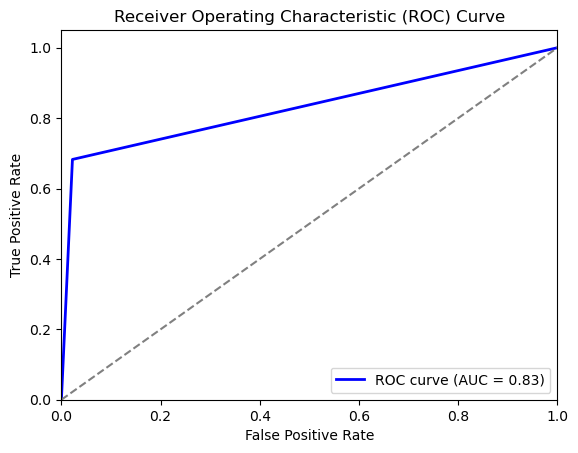

AUC Score: 0.83


In [195]:
fpr, tpr, _ = roc_curve(y_test, y_test_h_pred8)
roc_auc = auc(fpr, tpr)

plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='grey', linestyle='--')  # Random classifier line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Print AUC score
print(f"AUC Score: {roc_auc:.2f}")

### * **Hyper Parameter Tuning of eXtreme Gradient Boosting**

In [222]:
# Initialize the XGBoost classifier model
model_9 = XGBClassifier()

# Define the parameter distribution for GridSearchCV
param_dist_9 = {'gamma': [0.2,0.3,0.4,0.5],                  # Regularization parameter for the model
                'learning_rate': [0.01, 0.03, 0.06, 0.1, 0.2],    # Step size shrinking for gradient boosting
                'max_depth': [5,6,7,8,9,10],          # Maximum depth of trees
                'n_estimators': [100, 200, 300],      # Number of boosting rounds
                # 'reg_alpha': [0,0.1,0.2,0.4],         # L1 regularization term on weights
                # 'reg_lambda': [0,0.1,0.2],            # L2 regularization term on weights
                # 'min_child_weight': [1, 3, 5],        # Minimum sum of instance weight for child nodes
                # 'subsample': [0.7, 0.8, 1.0],         # Fraction of samples used per tree
                # 'colsample_bytree': [0.7, 0.8, 1.0],  # Fraction of features used per tree             
}

# Setup GridSearchCV to search for best hyperparameters
grid_search_xgbc = GridSearchCV(
    estimator=model_9,   # The model to tune
    param_grid=param_dist_9,   # The parameter distribution to sample from
    cv=5,                # specifies 5-fold cross-validation for evaluating each combination of hyperparameters
    scoring='accuracy',  # Use accuracy as the scoring metric
    n_jobs=-1,           # Use all processors for parallelism
    verbose=2,           # Display detailed logs during the process
    refit=True           # Refit the best model on the entire training set
)

# Perform hyperparameter search using GridSearchCV for eXtreme Gradient Boosting Classifier
grid_search_xgbc.fit(x_train_smote, y_train_smote)

# Retrieve the best hyperparameters and best accuracy score found during search
best_params9 = grid_search_xgbc.best_params_   # Best combination of hyperparameters
best_score9 = grid_search_xgbc.best_score_    # Best cross-validation accuracy score

# Print the best hyperparameters and the best score achieved during search
print(f"Best Parameters: {best_params9}")
print(f"Best Score: {best_score9}")

# Evaluate the best model found on the test and training set
y_test_h_pred9 = grid_search_xgbc.predict(x_test)     # Predict on test set
y_train_h_pred9 = grid_search_xgbc.predict(x_train)   # Predict on training set

# Calculate accuracy for both training and test datasets
test_accuracy9 = accuracy_score(y_test, y_test_h_pred9)     # Accuracy on test data
train_accuracy9 = accuracy_score(y_train,y_train_h_pred9)   # Accuracy on train data

# Compute the F1-score using the weighted average approach (suitable for imbalanced classes)
f1score9=f1_score(y_test, y_test_h_pred9)

# Print the evaluation metrics
print(f"Train Set Accuracy: {train_accuracy9}")  # Accuracy on training set
print(f"Test Set Accuracy: {test_accuracy9}")    # Accuracy on test set
print(f"f1 score: {f1score9}")                   # Weighted F1-score (balances precision & recall)

Fitting 5 folds for each of 360 candidates, totalling 1800 fits
Best Parameters: {'gamma': 0.2, 'learning_rate': 0.2, 'max_depth': 8, 'n_estimators': 100}
Best Score: 0.9298679067926582
Train Set Accuracy: 1.0
Test Set Accuracy: 0.922943722943723
f1 score: 0.7390029325513197


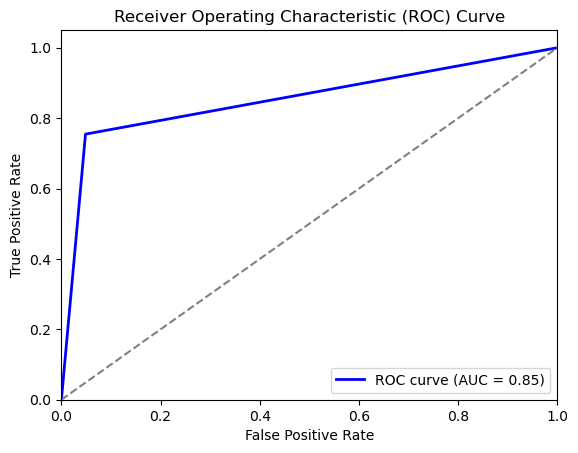

AUC Score: 0.85


In [224]:
fpr, tpr, _ = roc_curve(y_test, y_test_h_pred9)
roc_auc = auc(fpr, tpr)

plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='grey', linestyle='--')  # Random classifier line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Print AUC score
print(f"AUC Score: {roc_auc:.2f}")

### * **Hyper Parameter Tuning of LightGBM**

In [202]:
# Initialize the LightGBM classifier model
model_10 = LGBMClassifier()

# Define the parameter distribution for GridSearchCV
param_dist_10 = {'num_leaves': [31, 50, 100],          # Number of leaves in each tree. More leaves increase complexity.
                 'learning_rate': [0.01, 0.05, 0.1],   # Step size for weight updates. Lower values lead to slower but better convergence.
                 'n_estimators': [100, 200, 500],      # Number of boosting rounds (trees). More estimators improve learning but increase training time.
                 'max_depth': [-1, 10, 20],            # Maximum depth of each tree. -1 means no limit.
                 'min_data_in_leaf': [10, 20, 50]      # Minimum number of data points in a leaf. Higher values prevent overfitting.
}

# Setup GridSearchCV to search for best hyperparameters
grid_search_lgbmc = GridSearchCV(
    estimator=model_10,   # The model to tune
    param_grid=param_dist_10,   # The parameter distribution to sample from
    cv=5,                # specifies 5-fold cross-validation for evaluating each combination of hyperparameters
    scoring='accuracy',  # Use accuracy as the scoring metric
    n_jobs=-1,           # Use all processors for parallelism
    verbose=2,           # Display detailed logs during the process
    refit=True           # Refit the best model on the entire training set
)

# Perform hyperparameter search using GridSearchCV for LightGBM Classifier
grid_search_lgbmc.fit(x_train_smote, y_train_smote)

# Retrieve the best hyperparameters and best accuracy score found during search
best_params10 = grid_search_lgbmc.best_params_   # Best combination of hyperparameters
best_score10 = grid_search_lgbmc.best_score_    # Best cross-validation accuracy score

# Print the best hyperparameters and the best score achieved during search
print(f"Best Parameters: {best_params10}")
print(f"Best Score: {best_score10}")

# Evaluate the best model found on the test and training set
y_test_h_pred10 = grid_search_lgbmc.predict(x_test)     # Predict on test set
y_train_h_pred10 = grid_search_lgbmc.predict(x_train)   # Predict on training set

# Calculate accuracy for both training and test datasets
test_accuracy10 = accuracy_score(y_test, y_test_h_pred10)     # Accuracy on test data
train_accuracy10 = accuracy_score(y_train,y_train_h_pred10)   # Accuracy on train data

# Compute the F1-score using the weighted average approach (suitable for imbalanced classes)
f1score10=f1_score(y_test, y_test_h_pred10)

# Print the evaluation metrics
print(f"Train Set Accuracy: {train_accuracy10}")  # Accuracy on training set
print(f"Test Set Accuracy: {test_accuracy10}")    # Accuracy on test set
print(f"f1 score: {f1score10}")                   # Weighted F1-score (balances precision & recall)

Fitting 5 folds for each of 243 candidates, totalling 1215 fits
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10
[LightGBM] [Info] Number of positive: 2973, number of negative: 2973
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002526 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2074
[LightGBM] [Info] Number of data points in the train set: 5946, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
Best Parameters: {'learning_rate': 0.1, 'max_depth': -1, 'min_data_in_leaf': 10, 'n_estimators': 500, 'num_leaves': 31}
Best Score: 0.9510627531079716
[LightGBM] [Warning] min_data_in_leaf is set=10, min_child_samples=20 will be ignored. Current value: min

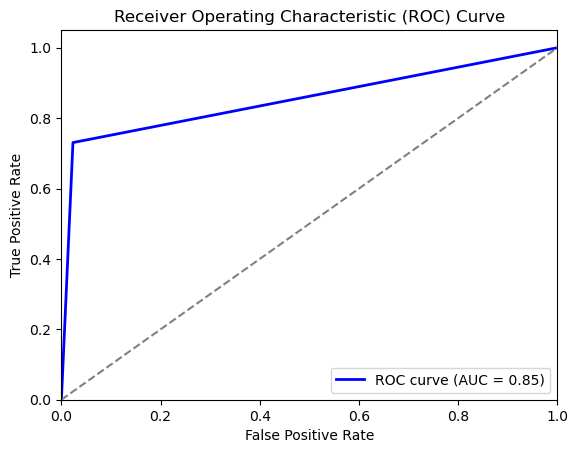

AUC Score: 0.85


In [207]:
fpr, tpr, _ = roc_curve(y_test, y_test_h_pred10)
roc_auc = auc(fpr, tpr)

plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='grey', linestyle='--')  # Random classifier line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Print AUC score
print(f"AUC Score: {roc_auc:.2f}")

---
# **Model Eveluation of Hyper Parameter Tuning:**
---

In [226]:
# List of test set predictions from different hyperparameter-tuned (HPT) models
all_h_model_test_pred = [y_test_h_pred1,y_test_h_pred2,y_test_h_pred3,y_test_h_pred4,y_test_h_pred5,y_test_h_pred6,y_test_h_pred7,y_test_h_pred8,y_test_h_pred9,y_test_h_pred10]
# Lists to store evaluation metrics for test set
all_h_model_test_accuracy_score = []
all_h_model_test_recall_score = []
all_h_model_test_precision_score = []
all_h_model_test_f1_score = []

# List of train set predictions from different hyperparameter-tuned (HPT) models
all_h_model_train_pred = [y_train_h_pred1,y_train_h_pred2,y_train_h_pred3,y_train_h_pred4,y_train_h_pred5,y_train_h_pred6,y_train_h_pred7,y_train_h_pred8,y_train_h_pred9,y_train_h_pred10]
# Lists to store evaluation metrics for train set
all_h_model_train_accuracy_score = []
all_h_model_train_recall_score = []
all_h_model_train_precision_score = []
all_h_model_train_f1_score = []

# Loop through each model's predictions and compute performance metrics
for i,j in zip(all_h_model_test_pred,all_h_model_train_pred):
    # Compute test set metrics
    all_h_model_test_accuracy_score.append(accuracy_score(y_test,i) * 100)
    all_h_model_test_recall_score.append(recall_score(y_test,i) * 100)
    all_h_model_test_precision_score.append(precision_score(y_test,i) * 100)
    all_h_model_test_f1_score.append(f1_score(y_test,i) * 100)
    
    # Compute train set metrics
    all_h_model_train_accuracy_score.append(accuracy_score(y_train,j) * 100)
    all_h_model_train_recall_score.append(recall_score(y_train,j) * 100)
    all_h_model_train_precision_score.append(precision_score(y_train,j) * 100)
    all_h_model_train_f1_score.append(f1_score(y_train,j) * 100)

# Define model names corresponding to the stored predictions
h_model_name = ['(HPT) of Logistic Regression',
                '(HPT) of Support Vector Machine',
                '(HPT) of K-Nearest Neighbor',
                '(HPT) of Decision Tree',
                '(HPT) of Bagging',
                '(HPT) of AdaBoost',
                '(HPT) of Random Forest',
                '(HPT) of Gradient Boosting',
                '(HPT) of Extreme Gradient Boosting',
                '(HPT) of LightGBM']

# Create a DataFrame for test set evaluation metrics
dt_h_test = {'accuracy_score_test':all_h_model_test_accuracy_score,
           'recall_score_test':all_h_model_test_recall_score,
           'precision_score_test':all_h_model_test_precision_score,
           'f1_score_test':all_h_model_test_f1_score}
df_h_model_ev_test = pd.DataFrame(dt_h_test, index=h_model_name)

# Create a DataFrame for train set evaluation metrics
dt_h_train = {'accuracy_score_train':all_h_model_train_accuracy_score,
            'recall_score_train':all_h_model_train_recall_score,
            'precision_score_train':all_h_model_train_precision_score,
            'f1_score_train':all_h_model_train_f1_score}
df_h_model_ev_train = pd.DataFrame(dt_h_train, index=h_model_name)

In [228]:
# Displaying the evaluation metrics DataFrame for the test set
# This will show accuracy, recall, precision, and F1 score for each hyperparameter-tuned model
df_h_model_ev_test

,accuracy_score_test,recall_score_test,precision_score_test,f1_score_test
(HPT) of Logistic Regression,76.277056,76.646707,35.261708,48.301887
(HPT) of Support Vector Machine,74.545455,68.862275,32.212885,43.893130
(HPT) of K-Nearest Neighbor,83.030303,46.107784,42.076503,44.000000
(HPT) of Decision Tree,83.896104,72.455090,46.360153,56.542056
(HPT) of Bagging,87.445887,66.467066,55.500000,60.490463
(HPT) of AdaBoost,92.034632,60.479042,79.527559,68.707483
(HPT) of Random Forest,90.822511,71.856287,67.039106,69.364162
(HPT) of Gradient Boosting,93.506494,68.263473,83.823529,75.247525
(HPT) of Extreme Gradient Boosting,92.294372,75.449102,72.413793,73.900293
(HPT) of LightGBM,94.112554,73.053892,84.137931,78.205128


In [230]:
# Displaying the evaluation metrics DataFrame for the training set
# This will show accuracy, recall, precision, and F1 score for each hyperparameter-tuned model
df_h_model_ev_train

,accuracy_score_train,recall_score_train,precision_score_train,f1_score_train
(HPT) of Logistic Regression,73.916811,75.664622,32.062392,45.039562
(HPT) of Support Vector Machine,76.458694,74.642127,34.564394,47.249191
(HPT) of K-Nearest Neighbor,99.653380,97.546012,100.000000,98.757764
(HPT) of Decision Tree,95.667244,93.865031,79.274611,85.955056
(HPT) of Bagging,98.555748,98.568507,91.809524,95.069034
(HPT) of AdaBoost,100.000000,100.000000,100.000000,100.000000
(HPT) of Random Forest,100.000000,100.000000,100.000000,100.000000
(HPT) of Gradient Boosting,100.000000,100.000000,100.000000,100.000000
(HPT) of Extreme Gradient Boosting,100.000000,100.000000,100.000000,100.000000
(HPT) of LightGBM,100.000000,100.000000,100.000000,100.000000


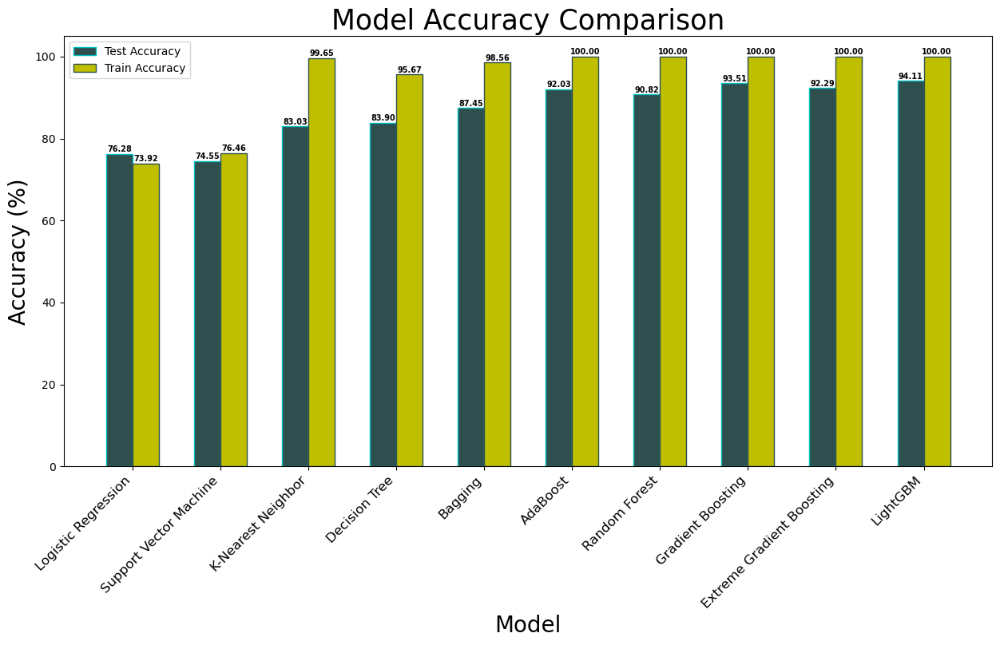

In [232]:
plt.figure(figsize=(15, 7))

# multipule bar graphe
# xticks function = To give name a stick and bring that name between 2 sticks
p_x = h_model_name
P_y = df_h_model_ev_test['accuracy_score_test']
P_z = df_h_model_ev_train['accuracy_score_train']

width = 0.3
p = np.arange(len(p_x))
p1 = [j + width for j in p ]

plt.bar(p,P_y,width,color = "darkslategrey",label = "Test Accuracy",edgecolor = 'c')
plt.bar(p1,P_z,width,color = "y",label = "Train Accuracy",edgecolor = 'darkslategrey')

# Add values on top of the bars
for i in range(len(p)):
    plt.text(p[i], P_y[i] + 0.5, f'{P_y[i]:.2f}', ha='center', fontsize=7, fontweight='bold')
    plt.text(p1[i], P_z[i] + 0.5, f'{P_z[i]:.2f}', ha='center', fontsize=7, fontweight='bold')

plt.xticks()       # xticks function = To give name a stick and bring that name between 2 sticks
plt.xticks(p+width/2,p_x,rotation=45, ha="right", fontsize=12)
plt.xlabel("Model", fontsize=20)
plt.ylabel("Accuracy (%)", fontsize=20)
plt.title("Model Accuracy Comparison", fontsize=25)
plt.legend()
plt.show()

In [288]:
#Importing the pickle module
import pickle   # Import the pickle module for serialization

In [290]:
# Save the trained model (gbc) to a file called 'PRCL-0017_Churn.pkl'
with open("PRCL-0017_Churn.pkl","wb") as f:  # Open the file "PRCL-0017_Churn.pkl" in write-binary mode
   pickle.dump(gbc,f)         # Serialize and save the model to the file

In [292]:
# Load the saved model from 'PRCL-0017_Churn.pkl'
with open("PRCL-0017_Churn.pkl","rb") as f:   # Open the file "PRCL-0017_Churn.pkl" in read-binary mode
   prediction=pickle.load(f)                # Deserialize the model from the file and assign it to `prediction`

In [294]:
# Print the loaded model to confirm it's been loaded correctly
prediction

GradientBoostingClassifier()

In [297]:
# Define the test input for index 703 as a numpy array
# x_test_index_703 represents a single sample with 10 features
x_test_index_703 = np.array([[0.794118,510,0,1,0.428915,0.538462,0.460434,0.158879,0.607249,0.673077,7,0.504000,1]])

# Define the expected output class index for this input
output_index_703 = 0

# Print the type of the input and the actual input data for index 703
print("Input Index 703 :-",type(x_test_index_703))  # Type of the input (numpy array)
print(x_test_index_703)   # Actual values of the input data

# Print the expected output (class label) for this index
print('Output Index 703 :-', output_index_703)  # Expected class label

Input Index 703 :- <class 'numpy.ndarray'>
[[7.94118e-01 5.10000e+02 0.00000e+00 1.00000e+00 4.28915e-01 5.38462e-01
  4.60434e-01 1.58879e-01 6.07249e-01 6.73077e-01 7.00000e+00 5.04000e-01
  1.00000e+00]]
Output Index 703 :- 0


In [299]:
# Use the trained model to predict the class for the given input
# Assuming `prediction` is a trained model with a `predict` method
predicted_value = prediction.predict(x_test_index_703)    
predicted_value

array([0])

In [301]:
# Check if the predicted value matches the expected output
if output_index_703 == predicted_value:
    print(f'The Prediction {predicted_value} is probably True ')  # Prints a message if the prediction is probably True
else:
    print(f'The Prediction {predicted_value} is probably False')  # Prints a message if the prediction is probably False

The Prediction [0] is probably True 


---
# **Model Comparison Report**


## Before Hyperparameter Turning
* The **Decision Tree** and **Random Forest** models achieved **100% accuracy**, indicating **overfitting**, as the model might have memorized the training data.
* **Bagging**, **Extreme Gradient Boosting (XGBoost)**, and **LightGBM** models also performed well on the training set with accuracy scores of **99.85%**, **99.94%**, and **98.78%**, respectively.
* The **Support Vector Machine (SVM)** had the lowest training performance, with an accuracy of **68.02%** and an F1 score of **18.42%**, suggesting it struggled to learn from the training data.
### Test Dataset Insights:
* On the test set, **Random Forest**, **Gradient Boosting**, **Extreme Gradient Boosting (XGBoost)**, and **LightGBM** models achieved high accuracy scores of **91.34%**, **89.00%**, **91.68%**, and **91.68%**, respectively.
* The **Bagging** model showed a good balance with an accuracy of **89.95%** and the highest F1 score of **67.23%** among all models, suggesting robust performance on unseen data.
* The **Support Vector Machine (SVM)** and **K-Nearest Neighbor (KNN)** models performed poorly on the test set, with low F1 scores of **21.05%** and **43.25%**, respectively.
### Recommendation:
* The **Bagging** model is recommended for deployment as it offers the best balance between accuracy and F1 score, indicating both high precision and recall.
* Additionally, **Gradient Boosting**, **XGBoost**, and **LightGBM** are also strong contenders due to their high accuracy and balanced performance.

## After Hyperparameter Turning 
#### **1. Overfitting Indicators:**
* ****Training Set:**** Many models, especially ****AdaBoost****, ****Random Forest****, ****Gradient Boosting****, ****Extreme Gradient Boosting****, and ****LightGBM****, show ****100% accuracy****, indicating ****overfitting****.
* ****Test Set:**** These same models have lower accuracy, with ****LightGBM**** being the highest at ****94.11%****, showing that the model did not generalize well to unseen data.
#### **2. Model Performance:**
* **Best Performing Model on Test Data:** **LightGBM** achieved the highest **accuracy (94.11%)**, **precision (84.14%)**, **recall (73.05%)**, and **F1 score (78.21%)** on the test data, making it the **best choice**.
* **Gradient Boosting** also performed well with **93.51% accuracy** and an **F1 score of 75.25%**, slightly behind **LightGBM**.
#### **3. Underperforming Models:**
* **Logistic Regression** and **Support Vector Machine (SVM)** have the **lowest precision** and **F1 scores**, indicating they might not be well-suited for this dataset.
* **K-Nearest Neighbor (KNN)** shows a **large performance drop** from **99.65% (train)** to **83.03% (test)** accuracy, highlighting **overfitting**.
#### **4. Balanced Performance:**
* **Bagging** model shows relatively **balanced metrics** with **87.45% accuracy** and **60.49% F1 score**, suggesting it is more **generalized** than some **ensemble methods**.

---
---

### **Recommendation**:
The **LightGBM model** is the **best choice** after **hyperparameter tuning** due to:
* **Highest accuracy** on the test set **(94.11%)**.
* **Strong precision** and **F1 score**, indicating **balanced performance**.
* **Good generalization**, with a **manageable drop** between **train and test metrics**, avoiding **extreme overfitting**.

---
---
# Report on Challenges faced

#### **Handling Categorical Data:** 
   * Converting categorical variables like state, area code, international plan, and voicemail plan into meaningful numerical representations.
#### **Feature Selection:** 
   * Identifying the most impactful features and eliminating redundant or less relevant ones.
#### **Feature Transformation:** 
   * Applying techniques like standardization, normalization, and log transformation to improve model performance.
#### **Creating New Features:** 
   * Deriving new features, such as interaction terms or customer service interaction frequency.
#### **Detecting Outliers:** 
   * Using techniques like Z-score, IQR method, or clustering algorithms to identify unusual customer behavior.
#### **Handling Outliers:** 
   * Deciding whether to remove, cap, or transform extreme values to reduce their impact on model performance.
#### **Imbalanced Data:** 
   * Addressing class imbalance using techniques like oversampling, undersampling, or SMOTE.
#### **Evaluation Metrics:** 
   * Focusing beyond accuracy, using precision, recall, and F1-score to measure performance effectively.
#### **Ensemble Learning vs. Simplicity:** 
   * Choosing between single models and ensemble techniques like bagging, boosting, or stacking.

#### **Addressing these challenges requires a combination of data preprocessing, model selection, business alignment, and ethical considerations. By overcoming these hurdles, the telecom company can effectively use machine learning to reduce churn and enhance customer retention strategies.**


---
# 1. Understanding the variables that are influencing the customers to migrate.

### Key Steps to Analyze Customer Churn:
1. **Check Churn Distribution**:  
   - Calculate the percentage of customers who churned (`Churn = True`) versus those who stayed.  
   
2. **Feature Importance Analysis**:  
   - Identify which features correlate most with churn.  
   - Possible influencing factors:  
     - **Call Usage**: High or low usage in `Day_Mins`, `Eve_Mins`, `Night_Mins`, and `International_Mins`.  
     - **Billing & Charges**: `Day_Charge`, `Eve_Charge`, etc.  
     - **Customer Service Calls**: `CustServ_Calls`—a high number might indicate dissatisfaction.  
     - **Plan Type**: `International_Plan`, `VMail_Plan`.  

3. **Statistical Tests & Visualization**:  
   - Use histograms, box plots, and correlation matrices to find trends.  
   - Compare distributions of `Day_Mins`, `CustServ_Calls`, etc., between churned and non-churned customers.  

4. **Predictive Modeling** (Optional):  
   - Use machine learning models (e.g., logistic regression, decision trees) to predict churn.  
   - Feature importance from models like Random Forest can highlight key variables.  

---
---
# 2. Creating Churn risk scores that can be indicative to drive retention campaigns.-

### **1. Define Churn Risk Factors**
Key variables that influence churn:
- **Usage Patterns**: `Day_Mins`, `Eve_Mins`, `Night_Mins`, `International_Mins`
- **Billing & Charges**: `Day_Charge`, `Eve_Charge`, `International_Charge`
- **Customer Service Calls**: `CustServ_Calls` (High complaints = high churn risk)
- **Plan Features**: `International_Plan`, `VMail_Plan`
- **Account Tenure**: `Account_Length` (Shorter tenure might indicate higher risk)

---

### **2. Assign Risk Weights**
Each variable should contribute differently to the final churn risk score. Example weight assignments:

| Variable               | Weight | Churn Influence |
|------------------------|--------|----------------|
| High `CustServ_Calls`  | 30%    | Dissatisfied customers likely to churn |
| High `Day_Mins` Usage  | 20%    | Heavy users might switch for better deals |
| `International_Plan` (Yes) | 15% | May indicate price-sensitive users |
| `VMail_Plan` (No)      | 10%    | No voicemail users might be disengaged |
| Low `Account_Length`   | 15%    | Newer customers are more likely to leave |
| High `International_Charge` | 10% | High-cost users may churn due to expenses |

*Weights can be fine-tuned based on data insights.*

---

### **3. Calculate Churn Risk Score**
A simple **Churn Risk Score** can be computed as:  

\[
\text{Churn Risk Score} = 0.3(\text{CustServ Calls}) + 0.2(\text{Day Mins}) + 0.15(\text{Intl Plan}) + ...
\]

- Normalize the values (scale 0-1) to avoid biases.
- Convert to a **score between 0 and 100** (higher = higher risk).

---

### **4. Segmentation for Retention Campaigns**
After computing churn risk scores, segment customers into **risk levels**:
- **Low Risk (0-40)** → No immediate action needed
- **Medium Risk (41-70)** → Proactive engagement (discounts, personalized offers)
- **High Risk (71-100)** → Immediate intervention (loyalty programs, customer service follow-up)

---

### **5. Predictive Model (Optional)**
For a more advanced approach, build a **Machine Learning model** (Logistic Regression, Decision Trees, or Random Forest) to predict churn probability and use that as the risk score

�

---
---
# **Identifying High-Risk Churn Customers and Enhancing Customer Touchpoints for Retention**

## Introduction
Customer churn is a critical challenge for businesses, especially in the telecommunications sector. Identifying high-risk churn customers and addressing their concerns proactively can significantly improve customer retention. This document outlines key indicators of customer churn, methods to identify at-risk customers, and strategies to enhance customer touchpoints for improved satisfaction and loyalty.

## Key Indicators of High-Risk Churn Customers
To identify customers likely to churn, we analyze the following parameters:
1. **Frequent Customer Service Calls**: Customers making more than 3-4 service calls indicate dissatisfaction and potential churn risk.
2. **International Plan Subscription**: Customers with an international plan might have high billing concerns, leading to dissatisfaction.
3. **Voice Mail Plan and Usage**: If a customer has a voicemail plan but rarely uses it, they may perceive it as unnecessary.
4. **High Call Usage with Low Satisfaction**: Customers with significant daily, evening, or night call usage but frequent service calls could be dissatisfied.
5. **High International Call Charges**: Unexpected high charges on international calls can lead to billing disputes and churn.
6. **Low Engagement with Value-Added Services**: Customers who do not use value-added services despite being subscribed may not see the benefits and could be at risk of leaving.

## Strategies for Enhancing Customer Touchpoints
To retain high-risk churn customers, the following strategies should be implemented:

### **1. Proactive Customer Care Support**
- Identify and flag customers with **3+ service calls** for special attention.
- Provide dedicated account managers for high-value customers.
- Regularly check in with customers showing dissatisfaction trends.

### **2. Request Fulfillment and Auto-Priority Tickets**
- Categorize complaints and requests from high-risk customers as **high priority**.
- Implement AI-based ticketing systems to expedite resolution.
- Ensure quick responses to billing disputes, technical issues, and service complaints.

### **3. Personalized Offers and Retention Campaigns**
- Provide tailored discounts or **loyalty rewards** for customers with high usage.
- Offer better-suited plans based on individual usage patterns.
- Educate customers on plan benefits and alternative options.

### **4. Enhanced Billing Transparency**
- Improve clarity in billing statements, especially for international charges.
- Offer real-time billing insights to help customers monitor usage.
- Provide proactive alerts when customers approach high billing thresholds.

### **5. Customer Engagement and Feedback Mechanism**
- Conduct regular surveys to gather insights on customer pain points.
- Offer incentives for customers to provide feedback.
- Implement a **customer satisfaction dashboard** for real-time monitoring.

## Conclusion
By identifying high-risk churn customers and enhancing customer touchpoints, businesses can significantly reduce churn rates and improve customer satisfaction. Prioritizing customer support, proactive retention strategies, and personalized engagement will help strengthen customer relationships and foster long-term loyalty.


---
---
---

# ************************* **Customer Churn Rate Report** *************************

In [128]:
from IPython.display import IFrame

# Display PDF in Jupyter Notebook
IFrame("Customer Churn Report.pdf", width=1080, height=600)

---